# Group 31

## Afonso Gorjão (20230575)
## Diogo Almeida (20230737)
## Pedro Carvalho (20230554)

In [75]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import logging
import matplotlib.cm as cm
from math import ceil
from sklearn.cluster import AgglomerativeClustering
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
#from sompy.visualization.mapview import View2D
#from sompy.visualization.bmuhits import BmuHitsView
#from sompy.visualization.hitmap import HitMapView
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE
from matplotlib.colors import ListedColormap
#import sompy
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
logging.getLogger('matplotlib.font_manager').disabled = True

# Metadata

- **ID** - Unique identifier of the record
- **Age** - Age of the user at October 31st, 2019, if it is not a dropout, or age of the user at the date specified in attribute EnrollmentFinish if it is a dropout
- **Gender** - Gender of the user (Male or Female)
- **Income** - Monthly salary of the user
- **EnrollmentStart** - Date of first enrollment
- **EnrollmentFinish** - Finish date of the last enrollment
- **LastPeriodStart** - Start date of the last activity or the last two months if less
- **LastPeriodFinish** - End date of the last activity or last two months if less
- **DateLastVisit** - Date and time of the user’s last visit to the sport facility
- **DaysWithoutFrequency** - Number of days the user did not visit the facility before being considered a dropout
- **LifetimeValue** - Total amount paid by the customer during the period in which he was enrolled (between EnrollmentStart and EnrollmentFinish)
- **UseByTime** - Indicates whether the user was enrolled in this form of use (True if he was, False otherwise)
- **AthleticsActivities** - Indicates if the user was ever enrolled in athletics activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **WaterActivities** - Indicates if the user was ever enrolled in water activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **FitnessActivities** - Indicates if the user was ever enrolled in fitness activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **DanceActivities** - Indicates if the user was ever enrolled in dance activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **TeamActivities** - Indicates if the user was ever enrolled in team activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **RacketActivities** - Indicates if the user was ever enrolled in racket activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **CombatActivities** - Indicates if the user was ever enrolled in combat sports activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **NatureActivities** - Indicates if the user was ever enrolled in nature activities during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **SpecialActivities** - Indicates if the user was enrolled in sports for disabled people during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **OtherActivities** - Indicates if the user was ever enrolled in other activities that do not fall into the other categories during the period between EnrollmentStart and EnrollmentFinish (True if it was, False otherwise)
- **NumberOfFrequencies** - Number of visits to the sports facility since the date indicated in EnrollmentStart and the date indicated in EnrollmentFinish
- **AttendedClasses** - Number of classes the user attended between EnrollmentStart and EnrollmentFinish
- **AllowedWeeklyVisitsBySLA** - Indicates the number of weekly visits that the user can make to the facilities according to the service he had hired in the last 2 months of his registration (between LastPeriodStart and LastPeriodFinish)
- **AllowedNumberOfVisitsBySLA** - Indicates the total number of visits that the user can make to the facilities according to the service he had hired in the last 2 months of his registration (between LastPeriodStart and LastPeriodFinish)
- **RealNumberOfVisits** - Indicates the actual number of visits that the user made to the facilities in the last period of his registration (between LastPeriodStart and LastPeriodFinish)
- **NumberOfRenewals** - Number of renewals during the registration period (between EnrollmentStart and EnrollmentFinish)
- **HasReferences** - This field contains the value True if NumberOfReferences > 0, or False otherwiseces > 0, or False otherwise
- **NumberOfReferences** - Number of people with which the user is related by family relationship or friendship  
- **Dropout** - Represents the user’s enrollment status, assuming the value True if he is quitting or False if he is nott
p

# Data Import

In [76]:
data=pd.read_csv("XYZ_sports_dataset.csv",sep=";")

In [77]:
data.set_index("ID",inplace=True)

In [78]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14942 non-null  int64  
 1   Gender                      14942 non-null  object 
 2   Income                      14447 non-null  float64
 3   EnrollmentStart             14942 non-null  object 
 4   EnrollmentFinish            14942 non-null  object 
 5   LastPeriodStart             14942 non-null  object 
 6   LastPeriodFinish            14942 non-null  object 
 7   DateLastVisit               14942 non-null  object 
 8   DaysWithoutFrequency        14942 non-null  int64  
 9   LifetimeValue               14942 non-null  float64
 10  UseByTime                   14942 non-null  int64  
 11  AthleticsActivities         14906 non-null  float64
 12  WaterActivities             14905 non-null  float64
 13  FitnessActivities           1490

# Functions

In [79]:
def inertia(data_out,num_feats,range_clusters,verbose=False):
    
    inertia=[]
    for n_clus in range_clusters:
        
        kmclust=KMeans(n_clusters=n_clus,init="k-means++",n_init=300,random_state=42)
        kmclust.fit(data_out[num_feats])
        inertia.append(kmclust.inertia_)
        if verbose:
            print("Inertia for ",n_clus," clusters:",kmclust.inertia_)
    
    plt.figure(figsize=(9,5))

    plt.plot(range_clusters,inertia)       
    
    plt.ylabel("Inertia: SSw")
    plt.xlabel("Number of clusters")
    plt.title("Inertia plot over clusters", size=15)
    plt.show()


####################################################################################################

def silhouette_graphs(data_out,num_feats,range_clusters,verbose=False):
        

    avg_silhouette = []
    for nclus in range_clusters:
        
        fig=plt.figure(figsize=(13, 7))

        kmclust=KMeans(n_clusters=nclus,init="k-means++",n_init=300,random_state=42)
        cluster_labels=kmclust.fit_predict(data_out[num_feats])
    
        silhouette_avg=silhouette_score(data_out[num_feats],cluster_labels)
        avg_silhouette.append(silhouette_avg)
        if verbose:
            print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")
    
        sample_silhouette_values=silhouette_samples(data_out[num_feats],cluster_labels)
    
        y_lower=10
        for i in range(nclus):
    
            ith_cluster_silhouette_values=sample_silhouette_values[cluster_labels==i]
            ith_cluster_silhouette_values.sort()
    
            size_cluster_i=ith_cluster_silhouette_values.shape[0]
            y_upper=y_lower+size_cluster_i
    
            color = cm.nipy_spectral(float(i) / nclus)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)
    
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    
            y_lower = y_upper + 10
    
        plt.title("The silhouette plot for the various clusters.")
        plt.xlabel("The silhouette coefficient values")
        plt.ylabel("Cluster label")
    
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
        xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
        plt.xlim([xmin, xmax])
    
        plt.ylim([0, len(data_out[num_feats]) + (nclus + 1) * 10])
    
        plt.yticks([]) 
        plt.xticks(np.arange(xmin, xmax, 0.1))


#######################################################################################################################################################

class Radar(object):
    def __init__(self, figure, title, labels, rect=None):
        if rect is None:
            rect = [0.05, 0.05, 0.9, 0.9]

        self.n = len(title)
        self.angles = np.arange(0, 360, 360.0/self.n)
        
        self.axes = [figure.add_axes(rect, projection='polar', label='axes%d' % i) for i in range(self.n)]
        self.ax = self.axes[0]
        self.ax.set_thetagrids(self.angles, labels=title, fontsize=14, backgroundcolor="white", zorder=999)  # Feature names
        self.ax.set_yticklabels([])
        
        for ax in self.axes[1:]:
            ax.xaxis.set_visible(False)
            ax.set_yticklabels([])
            ax.set_zorder(-99)

        for ax, angle, label in zip(self.axes, self.angles, labels):
            ax.spines['polar'].set_color('black')
            ax.spines['polar'].set_zorder(-99)
                     
    def plot(self, values,data,num_feats, *args, **kw):
        
        angle = np.deg2rad(np.r_[self.angles, self.angles[0]])
        values = np.r_[values, values[0]]
        alpha = 0.5
        self.ax.plot(angle, values, alpha=alpha, *args, **kw)
        kw['alpha'] = alpha
        kw['label'] = '_noLabel'
        self.ax.fill(angle, values, *args, **kw)

        #Minmax scaling
        for ax in self.axes:
            ax.set_ylim(0, 1)

        #Standard scaling
        # Set radar chart maximum values
        #max_values = data[num_feats].max()
        #self.ax.set_rmax(max(max_values))

        # Set radar chart minimum values
        #min_values = data[num_feats].min()
        #self.ax.set_rmin(min(min_values))


###############################################################################################################################################

def append_clust(data_out,num_feats,cat_feats,label_name,cluster_algo=None,clust=False):

    if clust:
        return cluster_algo.fit_predict(data_out[num_feats])

    km_labels=cluster_algo.fit_predict(data_out[num_feats])
    data_concat=pd.concat((data_out, pd.Series(km_labels, name=label_name, index=data_out.index)), axis=1)
    return data_concat


##############################################################################################################################################

def clust_profiles(data_concat, data_eng_out, label_name, num_feats1, num_feats2, cat_feats, group_by=False, used_scaler= None, group_all=False):

    colors=['tab:blue','tab:orange','tab:green','tab:red','tab:purple','tab:pink','tab:brown','tab:olive']
    value_color_map = {0: 'tab:blue', 1: 'tab:orange'}
    num_clusts=data_concat[label_name].max()+1
    feats_n=num_feats1.copy()
    feats_c=cat_feats.copy()
    feats_n.append(label_name)
    feats_c.remove('EnrollmentStart')
    feats_c.remove('EnrollmentFinish')
    feats_c.remove('LastPeriodStart')
    feats_c.remove('LastPeriodFinish')
    feats_c.remove('DateLastVisit')

    cluster_means=data_concat[feats_n].groupby(label_name).agg({"mean"}).T

    if group_by:
        data_unscaled1 = used_scaler.inverse_transform(data_concat[num_feats2])
        data_unscaled1 = pd.DataFrame(data_unscaled1, columns=num_feats2, index=data_concat.index)
        data_unscaled1 = data_unscaled1[num_feats1]
        data_unscaled1 = pd.concat([data_unscaled1, data_concat[label_name]], axis=1)

        cluster_means = data_unscaled1[feats_n].groupby(label_name).agg({"mean"}).T
        cluster_means[cluster_means.columns] = cluster_means[cluster_means.columns].astype(float)
        cluster_means_s = cluster_means.style.format(precision=2).background_gradient(axis=0)
       
        if group_all:
            data_unscaled2 = data_eng_out[num_feats2]  
            data_unscaled2 = pd.DataFrame(data_unscaled2, columns=num_feats2, index=data_concat.index)
            data_unscaled2 = pd.concat([data_unscaled2, data_concat[label_name]], axis=1)
           
            cluster_means_all = data_unscaled2.groupby(label_name).agg({"mean"}).T
            cluster_means_all[cluster_means_all.columns] = cluster_means_all[cluster_means_all.columns].astype(float)
            cluster_means_s_all = cluster_means_all.style.format(precision=2).background_gradient(axis=0)

            highlight_rows = cluster_means_s_all.index.isin(cluster_means_s.index)
            cluster_means_s_all = cluster_means_s_all.apply(
                lambda x: ['background: lightcoral' if row else '' for row in highlight_rows],
                axis=0
            )
            return cluster_means_s_all

        return cluster_means_s
        
    
    for clust in range(num_clusts):

        category_counts=data_concat[data_concat[label_name]==clust]

        fig = plt.figure(figsize=(20, 11))
        subfigs = fig.subfigures(1, 2, wspace=0.07)
        axsleft=subfigs[0].subplots(ncols=4, nrows=3)
        axsright=Radar(subfigs[1],num_feats1, [clust])
        axsright.plot(values=cluster_means[clust],data=data_concat,num_feats=num_feats1)
        
        for ax,feat in zip(axsleft.flatten(),feats_c): 

            v_c=category_counts[feat].value_counts()
            v_c.plot.pie(ax=ax,autopct='%1.1f%%',startangle=90,title=feat,colors=[value_color_map[val] for val in v_c.index])
            ax.set_ylabel('')
            
        plt.subplots_adjust(wspace=0.0005, hspace=0.0005)
        fig.suptitle(str(clust), fontsize=20)
        plt.show()

    fig = plt.figure(figsize=(20, 11))
    subfigs = fig.subfigures(1, 2, wspace=0.07)

    counts=data_concat[label_name].value_counts()
    new_colors=[]
    for i in counts.index:
        new_colors.append(colors[i])
        
    axesleft=subfigs[0].subplots()
    counts.plot.pie(ax=axesleft,autopct='%1.1f%%',startangle=90,title="Cluster Sizes",fontsize=15,colors=new_colors)
    axesleft.set_ylabel('')
    axesleft.set_title("Cluster Sizes",size=22)
    
    axsright= Radar(subfigs[1], num_feats1, np.unique(data_concat[label_name]))
    for k in np.unique(data_concat[label_name]):
        axsright.plot(values=cluster_means[k],data=data_concat,num_feats=num_feats1,label='cluster {}'.format(k),color=colors[k])
    
    axsright.ax.legend()
    #axsright.ax.set_title("Cluster characteristics: Feature means per cluster", size=22, pad=60)
    plt.show()

################################################################################################################

def get_ss(df):

    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df,num_feats, label):
    sst = get_ss(df[num_feats])
    ssw = np.sum(df[num_feats].groupby(df[label]).apply(get_ss))
    return 1 - ssw/sst


################################################################################################################

# EDA

In [80]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14942 non-null  int64  
 1   Gender                      14942 non-null  object 
 2   Income                      14447 non-null  float64
 3   EnrollmentStart             14942 non-null  object 
 4   EnrollmentFinish            14942 non-null  object 
 5   LastPeriodStart             14942 non-null  object 
 6   LastPeriodFinish            14942 non-null  object 
 7   DateLastVisit               14942 non-null  object 
 8   DaysWithoutFrequency        14942 non-null  int64  
 9   LifetimeValue               14942 non-null  float64
 10  UseByTime                   14942 non-null  int64  
 11  AthleticsActivities         14906 non-null  float64
 12  WaterActivities             14905 non-null  float64
 13  FitnessActivities           1490

In [82]:
num_feats=["Age","Income","DaysWithoutFrequency","LifetimeValue","NumberOfFrequencies","AttendedClasses","AllowedWeeklyVisitsBySLA","AllowedNumberOfVisitsBySLA","RealNumberOfVisits","NumberOfRenewals"]
cat_feats=["Gender","EnrollmentStart","EnrollmentFinish","LastPeriodStart","LastPeriodFinish","DateLastVisit","UseByTime","AthleticsActivities","WaterActivities","FitnessActivities","TeamActivities","RacketActivities","CombatActivities","SpecialActivities","OtherActivities","HasReferences","Dropout"]
bool_feats=["AthleticsActivities","WaterActivities","FitnessActivities","TeamActivities","RacketActivities","CombatActivities","SpecialActivities","OtherActivities","HasReferences","Dropout","UseByTime"]
date_columns = ['EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit']
data[date_columns] = data[date_columns].apply(pd.to_datetime)

In [83]:
for col in data:
    print(col,": ",data[col].unique())
    
    if any(data[col]==""):
        print("This columns has empty strings")
    if any(pd.isna(data[col])):
        print("This columns has nan")
    
    print("\n ############################ \n")

Age :  [60 29 23  9 35 24 14 20 63 12 28 26 47 39 19 30 43 44 13 17 22 21  2  1
 74 38 46 34  6 11 42 56 33 52 54 32  7 27  3 37 31 49 57 15  8 83  5 53
 40 41 45 18 64 51 25 69 55 48 16 10 72 62 36  4 78 50 67 66 59 86 81 73
 65  0 68 80 58 76 85 61 75 82 71 70 79 77 84 87]

 ############################ 

Gender :  ['Female' 'Male']

 ############################ 

Income :  [ 5500.  2630.  1980.     0.  4320.  2220.  2340.  1910.  3220.  1800.
  2790.  4040.  2050.  2580.  4490.  3890.  1660.  2510.  3020.  2120.
  3340.  1710.  2520.  1290.  1970.  1230.  1520.  1820.  1670.  5210.
  1720.  1620.  3300.  2100.  1360.  1500.  2190.  3580.  1650.  4250.
  6540.  2020.  1440.  7210.  4910.  1680.  1730.  2960.  2130.  2490.
  5230.    nan  4790.  2320.  2500.  2590.  2530.  3180.  2110.  1490.
  4990.  1600.  5690.  3780.  1810.  3270.  1300.  1310.  5080.  1890.
  6490.  1450.  2540.  1590.  1690.  2730.  6080.  2250.  2800.  1610.
  4010.  3570.  2370.  2690.  5700.  2610.  5600.  1

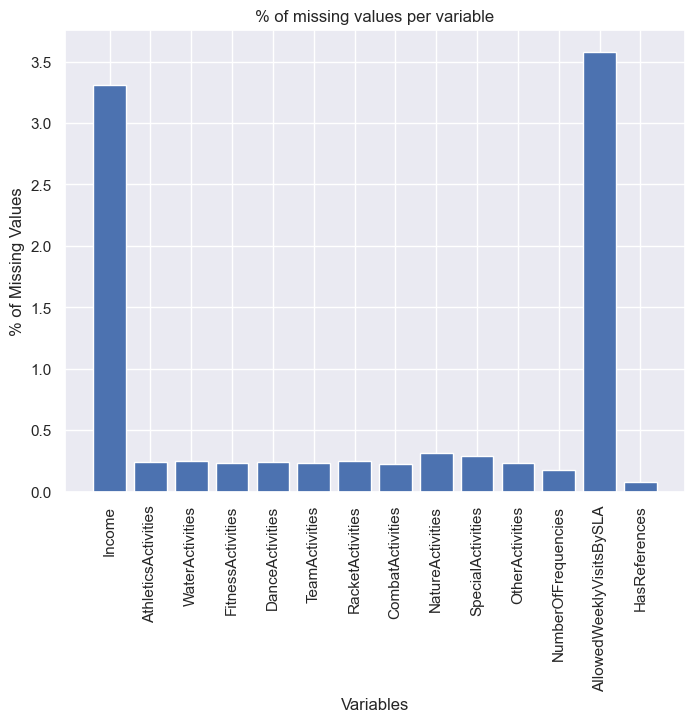

In [84]:
mv = {}

for var in data:
    nr = round(data[var].isna().mean()*100,3)
    if nr > 0:
        mv[var] = nr

plt.figure(figsize=(8, 6))
plt.bar(mv.keys(), mv.values())
plt.title('% of missing values per variable')
plt.xlabel('Variables')
plt.ylabel('% of Missing Values')
plt.xticks(rotation=90) 

plt.show()

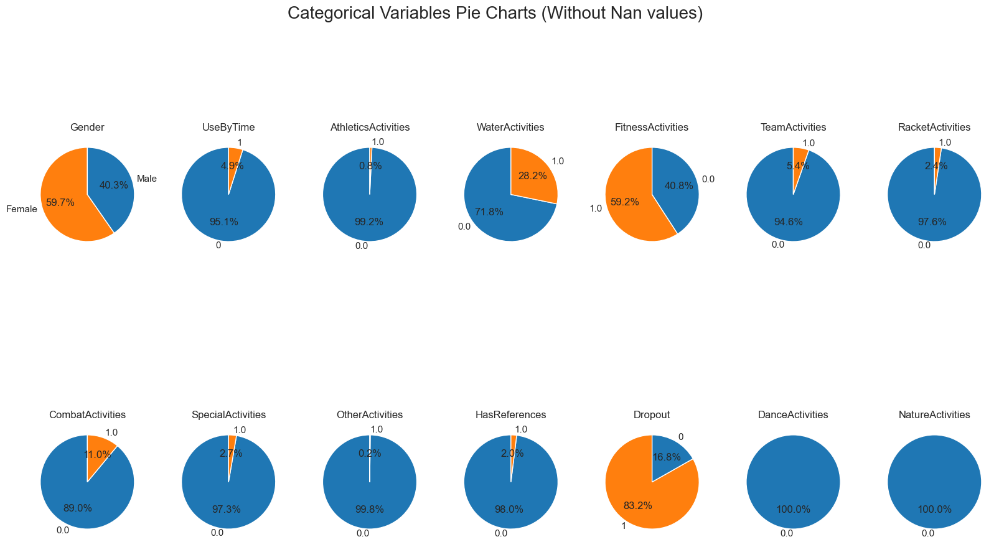

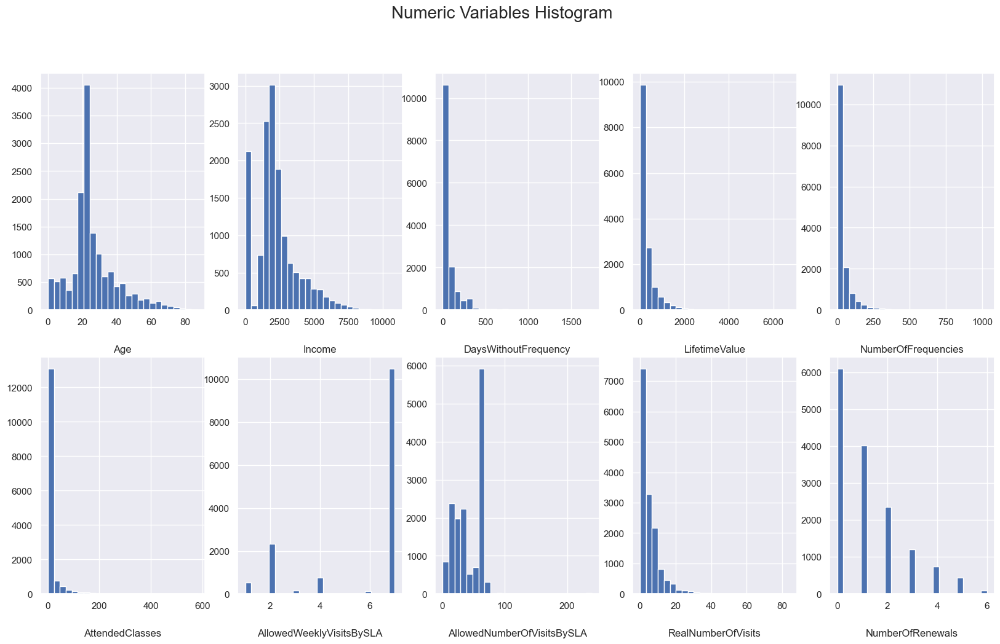

In [85]:
feats_c=cat_feats.copy()
feats_c.remove('EnrollmentStart')
feats_c.remove('EnrollmentFinish')
feats_c.remove('LastPeriodStart')
feats_c.remove('LastPeriodFinish')
feats_c.remove('DateLastVisit')
feats_c.append("DanceActivities")
feats_c.append("NatureActivities")
data_plot = data.dropna()

fig, axes=plt.subplots(2,ceil(len(feats_c)/2),figsize=(20, 11))
value_color_map = {0: 'tab:blue', 1: 'tab:orange'}
value_color_map_gender = {"Male": 'tab:blue', "Female": 'tab:orange'}

for ax,feat in zip(axes.flatten(),feats_c): 
    v_c=data_plot[feat].value_counts()
    if feat=="Gender":
        v_c.plot.pie(ax=ax,autopct='%1.1f%%',startangle=90,title=feat,colors=[value_color_map_gender[val] for val in v_c.index])
        ax.set_ylabel('')
    else:
        v_c.plot.pie(ax=ax,autopct='%1.1f%%',startangle=90,title=feat,colors=[value_color_map[val] for val in v_c.index])
        ax.set_ylabel('')

title = "Categorical Variables Pie Charts (Without Nan values)"
plt.suptitle(title,fontsize=20)

plt.show()



fig, axes=plt.subplots(2,ceil(len(num_feats)/2),figsize=(20, 11))

for ax,feat in zip(axes.flatten(),num_feats): 
    ax.hist(data[feat],bins=25)
    ax.set_title(feat, y=-0.2)

title = "Numeric Variables Histogram"
plt.suptitle(title,fontsize=20)

plt.show()

# Data Preprocessing

Removing "empty" features

In [11]:
data.drop("DanceActivities",axis=1,inplace=True)
data.drop("NatureActivities",axis=1,inplace=True)

data['Male'] = (data['Gender'] == 'Male').astype(bool)
data = data.drop('Gender', axis=1)
cat_feats.remove('Gender')
cat_feats.append('Male')

data["AthleticsActivities"]=data["AthleticsActivities"].astype("boolean")
data["WaterActivities"]=data["WaterActivities"].astype("boolean")
data["FitnessActivities"]=data["FitnessActivities"].astype("boolean")
data["TeamActivities"]=data["TeamActivities"].astype("boolean")
data["RacketActivities"]=data["RacketActivities"].astype("boolean")
data["CombatActivities"]=data["CombatActivities"].astype("boolean")
data["SpecialActivities"]=data["SpecialActivities"].astype("boolean")
data["OtherActivities"]=data["OtherActivities"].astype("boolean")
data["HasReferences"]=data["HasReferences"].astype("boolean")
data["Dropout"]=data["Dropout"].astype("boolean")
data["UseByTime"]=data["UseByTime"].astype("boolean")

Fixing and removing incoherent data

In [12]:
fixed_date = pd.to_datetime('2019-10-31')
# fix date of enrollment finish
data.loc[data['EnrollmentFinish'] == data['EnrollmentStart'], 'EnrollmentFinish'] = fixed_date

In [13]:
rows_to_keep = ~(
    ((data['LastPeriodStart'] < data['EnrollmentStart']) & 
     (data['LastPeriodFinish'] < data['EnrollmentStart'])) |
    ((data['LastPeriodStart'] > data['EnrollmentFinish']) & 
     (data['LastPeriodFinish'] > data['EnrollmentFinish'])) |
    ((data["NumberOfFrequencies"] < data["RealNumberOfVisits"]) & 
     (data["LastPeriodStart"] > data["EnrollmentStart"]))
)

# Filter the DataFrame to keep the desired rows
data_out = data[rows_to_keep]

data_out.loc[data_out["NumberOfFrequencies"]<data_out["RealNumberOfVisits"], 'RealNumberOfVisits'] = data_out['NumberOfFrequencies']

# fix dates of last period 
data_out.loc[data_out['EnrollmentStart'] > data_out['LastPeriodStart'], 'LastPeriodStart'] = data_out['EnrollmentStart']
data_out.loc[data_out['EnrollmentFinish'] < data_out['LastPeriodFinish'], 'LastPeriodFinish'] = data_out['EnrollmentFinish']

# Calculate the percentage of data kept after removal
percentage_kept = np.round(data_out.shape[0] / data.shape[0] * 100, 4)

# Print or inspect the resulting DataFrame
print("Percentage of data base kept after removal:", percentage_kept)

Percentage of data base kept after removal: 99.7055


In [14]:
scaler = MinMaxScaler()
#scaler = StandardScaler()

scaler.fit(data_out[num_feats])
data_out_scaled=scaler.transform(data_out[num_feats])
data_out_scaled=pd.DataFrame(data_out_scaled,columns=data_out[num_feats].columns).set_index(data_out[num_feats].index)
data_out_scaled=pd.concat([data_out[cat_feats],data_out_scaled],axis=1).set_index(data_out_scaled.index)

imputer=KNNImputer(n_neighbors=9, weights="uniform")
data_out_scaled[num_feats]=imputer.fit_transform(data_out_scaled[num_feats])

modes=data_out_scaled[cat_feats].mode().loc[0]
data_out_scaled[cat_feats].fillna(modes, inplace=True)

for feat in bool_feats:
    bool_mode=data[feat].mode()[0]
    data_out_scaled[feat].fillna(bool_mode,inplace=True)

data_out_unscaled = scaler.inverse_transform(data_out_scaled[num_feats])
data_out_unscaled = pd.DataFrame(data_out_unscaled, columns=num_feats, index=data_out_scaled[num_feats].index)
data_out_unscaled = pd.concat([data_out_scaled[cat_feats], data_out_unscaled], axis=1)


# Feature Engineering

In [15]:
# NumberFrequencies -> EnrollmentDuration
# RealNumberOfVisits -> LastPeriodDuration

data_eng=data_out_unscaled.copy()

# enrollment duration
data_eng['EnrollmentDuration'] = (data_eng['EnrollmentFinish'] - data_eng['EnrollmentStart']).dt.days

#########################

# last period duration 
data_eng['LastPeriodDuration'] = (data_eng['LastPeriodFinish'] - data_eng['LastPeriodStart']).dt.days



In [16]:
#### VISITS

# fix real number of visits to be average number of visits in last period/all time 
data_eng['LastNumberOfVisits_norm'] = data_eng['RealNumberOfVisits'] / data_eng['LastPeriodDuration']
data_eng['NumberOfVisits_norm']= data_eng['NumberOfFrequencies'] / data_eng['EnrollmentDuration']

# number of frequencies per week in enrollment duration
data_eng['VisitWeeklyFrequencyEnrollment'] = data_eng['NumberOfVisits_norm'] * 7

# number of frequencies per week in last period duration
data_eng['VisitWeeklyFrequencyLastPeriod'] = data_eng['LastNumberOfVisits_norm'] * 7

# rate of weekly visits in last period to allowed number of visits by SLA
data_eng['AllowedVisitsRate_LastPeriod'] = data_eng['VisitWeeklyFrequencyLastPeriod'] / data_eng['AllowedWeeklyVisitsBySLA']

# rate of weekly visits in enrollment duration to allowed number of visits by SLA
data_eng['AllowedVisitsRate_Enrollment'] = data_eng['VisitWeeklyFrequencyEnrollment'] / data_eng['AllowedWeeklyVisitsBySLA']

#### LAST PERIOD COMPARISON WITH ENROLLMENT, TRYING TO SEE DECAY

# ratio between last period visits and enrollment visits
data_eng['LP_Visits_DecayRatio'] = data_eng['LastNumberOfVisits_norm'] / data_eng['NumberOfVisits_norm']

#### VALUE

# value for time
data_eng['ValueDuringEnroll'] = data_eng['LifetimeValue'] / data_eng['EnrollmentDuration']

# value per attendance
data_eng['ValuePerAttendance'] = data_eng['LifetimeValue'] / data_eng['NumberOfFrequencies']

#### CLASSES

# atended classes normalized
data_eng['AttendedClasses_norm'] = data_eng['AttendedClasses'] / data_eng['EnrollmentDuration']

# ratio between gym visits and classes
data_eng['ClassChoice_Frequency'] = data_eng['AttendedClasses'] / data_eng['NumberOfFrequencies']

# variety of classes attended
data_eng['NumActivitiesTried'] = data_eng[['AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'TeamActivities', 'RacketActivities', 'CombatActivities', 'SpecialActivities', 'OtherActivities']].sum(axis=1)

#### RENEWALS

# number of renewals normalized
data_eng['NumberOfRenewals_norm'] = data_eng['NumberOfRenewals'] / data_eng['EnrollmentDuration']

##########################

#BOOLEAN FEATURES

# boolean for more than one activity
data_eng['MultipleActivities'] = data_eng['NumActivitiesTried'] > 1

# boolean feature for early dropouts, less than 3 months in the gym
#data_eng['EarlyDropout'] = data_eng['EnrollmentDuration'] < 92

##########################

# EXTRA FEATURE
data_eng['HowLongSinceLastVisit'] = (fixed_date - data_eng['DateLastVisit']).dt.days


##########################

eng_feats=['EnrollmentDuration','LastPeriodDuration','LastNumberOfVisits_norm','NumberOfVisits_norm','AllowedVisitsRate_LastPeriod','AllowedVisitsRate_Enrollment'
           ,'LP_Visits_DecayRatio','ValueDuringEnroll','ValuePerAttendance','AttendedClasses_norm','ClassChoice_Frequency','NumActivitiesTried','NumberOfRenewals_norm','HowLongSinceLastVisit']

num_feats_all=num_feats+eng_feats
cat_feats_all=cat_feats.copy()
cat_feats_all.remove('OtherActivities')
cat_feats_all.append('MultipleActivities')

# Outliers in engineered features and Correlations

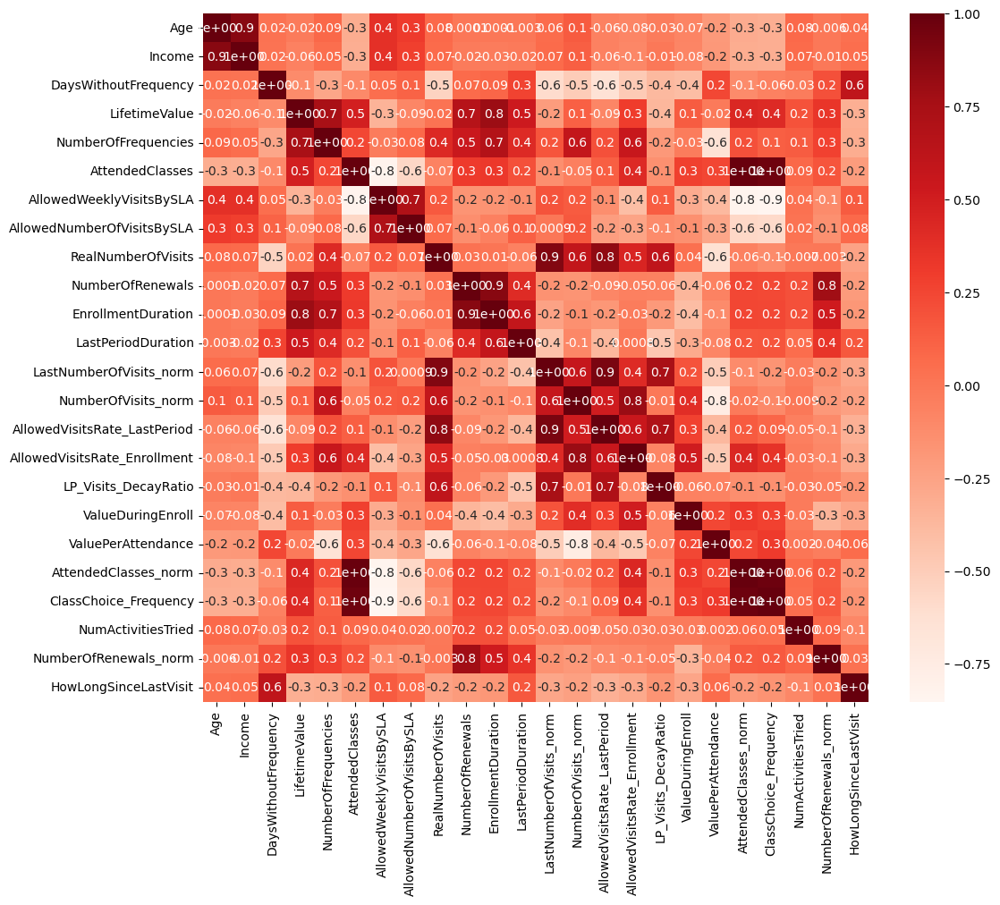

In [17]:
cor=data_eng[num_feats_all].corr(method ='spearman')

plt.figure(figsize=(12,10))
sns.heatmap(data=cor,annot=True,cmap=plt.cm.Reds,fmt='.1')
plt.show()

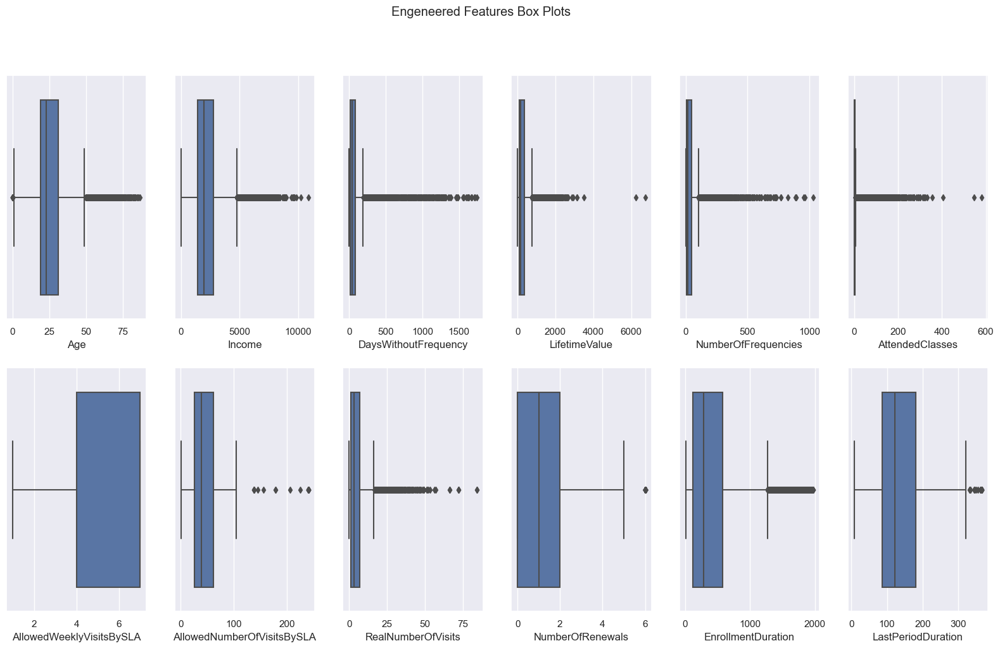

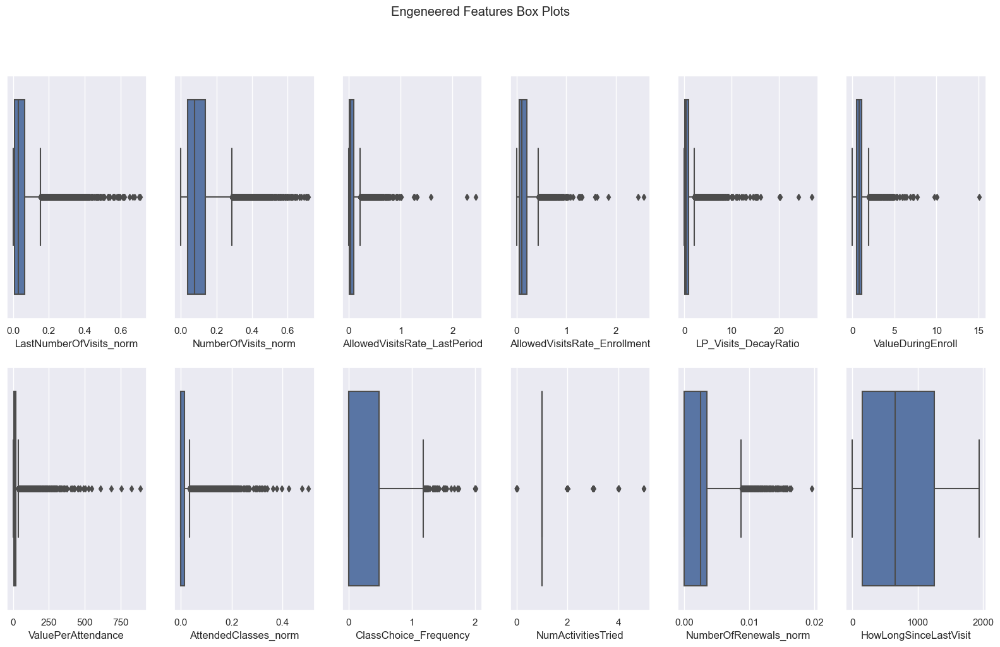

In [18]:
div=int(len(num_feats_all)/2)
num_feats_all_1=num_feats_all[:div]
num_feats_all_2=num_feats_all[div:]

sns.set()
fig, axes=plt.subplots(2,ceil(len(num_feats_all_1)/2),figsize=(20, 11))

for ax,feat in zip(axes.flatten(),num_feats_all_1): 
    sns.boxplot(x=data_eng[feat],ax=ax)

title = "Engeneered Features Box Plots"
plt.suptitle(title)

plt.show()

sns.set()
fig, axes=plt.subplots(2,ceil(len(num_feats_all_2)/2),figsize=(20, 11))

for ax,feat in zip(axes.flatten(),num_feats_all_2): 
    sns.boxplot(x=data_eng[feat],ax=ax)

title = "Engeneered Features Box Plots"
plt.suptitle(title)

plt.show()


Percentage of data base kept after coherence checking removal: 99.7055

In [19]:
data_eng_out = data_eng.copy()
outliers=pd.DataFrame()

outliers=pd.concat([outliers,data_eng_out[data_eng_out["Age"] > 75]])
data_eng_out = data_eng_out[data_eng_out["Age"] <= 75]

outliers=pd.concat([outliers,data_eng_out[data_eng_out['NumberOfVisits_norm'] > 0.4]])
data_eng_out = data_eng_out[data_eng_out['NumberOfVisits_norm'] < 0.4]

outliers=pd.concat([outliers,data_eng_out[data_eng_out["EnrollmentDuration"] > 1900]])
data_eng_out = data_eng_out[data_eng_out["EnrollmentDuration"] < 1900]

outliers=pd.concat([outliers,data_eng_out[data_eng_out["ValueDuringEnroll"] > 3]])
data_eng_out = data_eng_out[data_eng_out["ValueDuringEnroll"] < 3]

outliers=pd.concat([outliers,data_eng_out[data_eng_out["AttendedClasses_norm"] > 0.2]])
data_eng_out = data_eng_out[data_eng_out["AttendedClasses_norm"] < 0.2]

outliers=pd.concat([outliers,data_eng_out[data_eng_out["ClassChoice_Frequency"] > 1.2]])
data_eng_out = data_eng_out[data_eng_out["ClassChoice_Frequency"] < 1.2]

outliers=pd.concat([outliers,data_eng_out[data_eng_out["ValuePerAttendance"] > 100]])
data_eng_out = data_eng_out[data_eng_out["ValuePerAttendance"] < 100]

#outliers=pd.concat([outliers,data_eng_out[data_eng_out["AllowedVisitsRate_Enrollment"] > 0.75]])
#data_eng_out = data_eng_out[data_eng_out["AllowedVisitsRate_Enrollment"] < 0.75]


#data_eng_out = data_eng_out[data_eng_out["DaysWithoutFrequency"] < 400]
#data_eng_out = data_eng_out[data_eng_out["DaysWithoutFrequency"] <= 700]
#data_eng_out = data_eng_out[data_eng_out["AllowedVisitsRate_LastPeriod"] < 0.65]
#data_eng_out = data_eng_out[data_eng_out["AllowedVisitsRate_Enrollment"] < 0.75]
#data_eng_out = data_eng_out[data_eng_out['LastNumberOfVisits_norm'] < 0.4]


print("Percentage of data base kept after outlier removal:",np.round(data_eng_out.shape[0]/data.shape[0],4))

Percentage of data base kept after outlier removal: 0.9447


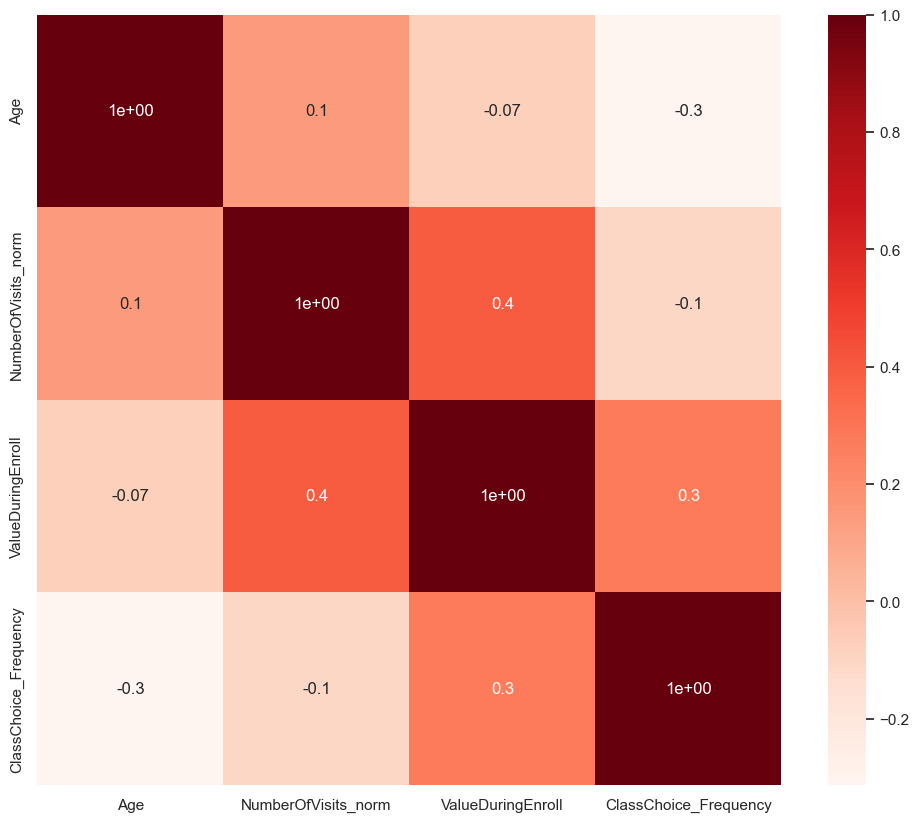

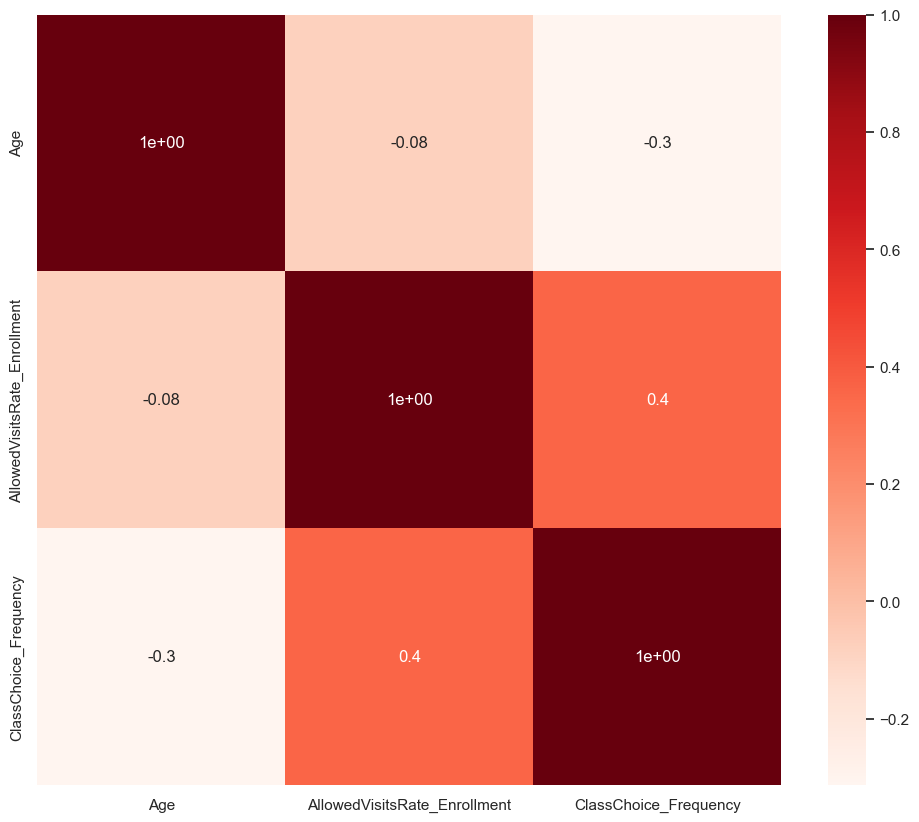

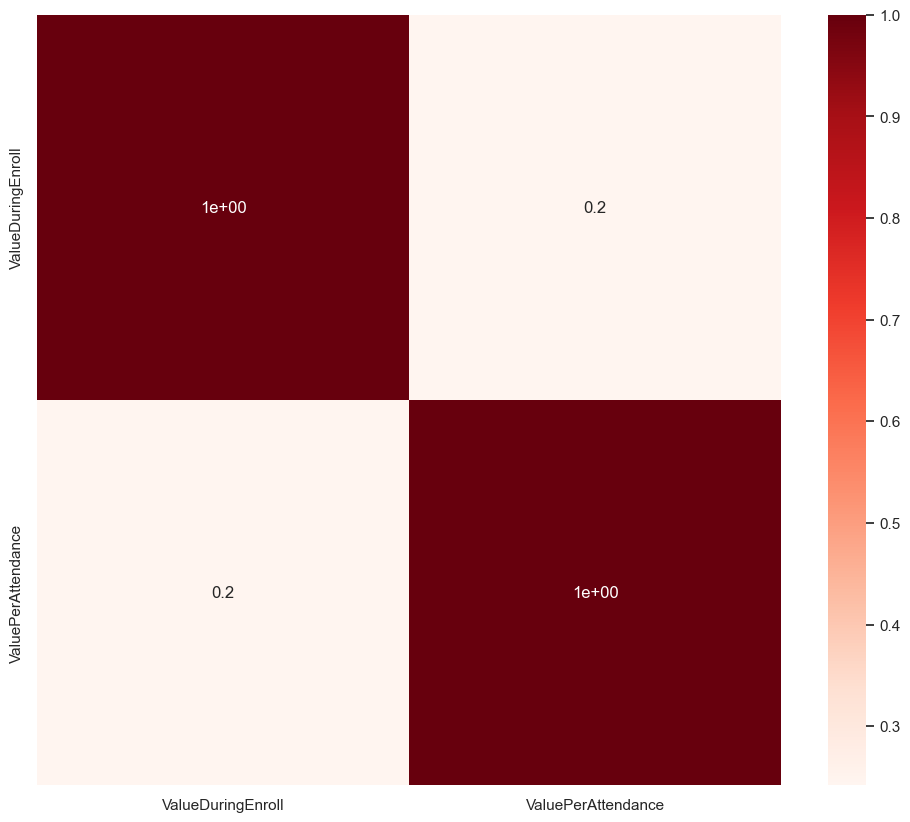

In [20]:
selec_feats=num_feats_all.copy()
#selec_feats.remove('Age')
selec_feats.remove('Income')
selec_feats.remove('RealNumberOfVisits')
selec_feats.remove('LifetimeValue')
#selec_feats.remove('ClassChoice_Frequency')
selec_feats.remove('NumberOfRenewals')
selec_feats.remove('AllowedNumberOfVisitsBySLA')
selec_feats.remove('NumberOfFrequencies')
selec_feats.remove('HowLongSinceLastVisit')
selec_feats.remove('AllowedWeeklyVisitsBySLA')
selec_feats.remove('AllowedVisitsRate_Enrollment')
selec_feats.remove('AllowedVisitsRate_LastPeriod')
selec_feats.remove('AttendedClasses')
selec_feats.remove('AttendedClasses_norm')
selec_feats.remove('LastNumberOfVisits_norm')
selec_feats.remove('ValuePerAttendance')
selec_feats.remove('LastPeriodDuration')
selec_feats.remove('LP_Visits_DecayRatio')
selec_feats.remove('NumActivitiesTried')
#selec_feats.remove('ValueDuringEnroll')
selec_feats.remove('NumberOfRenewals_norm')
selec_feats.remove('DaysWithoutFrequency')
#selec_feats.remove('NumberOfVisits_norm')
selec_feats.remove('EnrollmentDuration')

seg_1=num_feats_all.copy()
#seg_1.remove('Age')
seg_1.remove('Income') ##
seg_1.remove('RealNumberOfVisits') ##
seg_1.remove('LifetimeValue') ##
#seg_1.remove('ClassChoice_Frequency')
seg_1.remove('NumberOfRenewals')
seg_1.remove('AllowedNumberOfVisitsBySLA') ##
seg_1.remove('NumberOfFrequencies') ##
seg_1.remove('HowLongSinceLastVisit') 
seg_1.remove('AllowedWeeklyVisitsBySLA')
#seg_1.remove('AllowedVisitsRate_Enrollment')
seg_1.remove('AllowedVisitsRate_LastPeriod') 
seg_1.remove('AttendedClasses') ##
seg_1.remove('AttendedClasses_norm')
seg_1.remove('LastNumberOfVisits_norm')
seg_1.remove('ValuePerAttendance')
seg_1.remove('LastPeriodDuration')
seg_1.remove('LP_Visits_DecayRatio') ##
seg_1.remove('NumActivitiesTried') ##
seg_1.remove('ValueDuringEnroll')
seg_1.remove('NumberOfRenewals_norm')
seg_1.remove('DaysWithoutFrequency')
seg_1.remove('NumberOfVisits_norm')
seg_1.remove('EnrollmentDuration')

seg_2=num_feats_all.copy()
seg_2.remove('Age')
seg_2.remove('Income') ##
seg_2.remove('RealNumberOfVisits') ##
seg_2.remove('LifetimeValue') ##
seg_2.remove('ClassChoice_Frequency')
seg_2.remove('NumberOfRenewals')
seg_2.remove('AllowedNumberOfVisitsBySLA') ##
seg_2.remove('NumberOfFrequencies') ##
seg_2.remove('HowLongSinceLastVisit')
seg_2.remove('AllowedWeeklyVisitsBySLA')
seg_2.remove('AllowedVisitsRate_Enrollment')
seg_2.remove('AllowedVisitsRate_LastPeriod')
seg_2.remove('AttendedClasses') ##
seg_2.remove('AttendedClasses_norm')
seg_2.remove('LastNumberOfVisits_norm')
#seg_2.remove('ValuePerAttendance')
seg_2.remove('LastPeriodDuration')
seg_2.remove('LP_Visits_DecayRatio') ##
seg_2.remove('NumActivitiesTried') ##
#seg_2.remove('ValueDuringEnroll')
seg_2.remove('NumberOfRenewals_norm')
seg_2.remove('DaysWithoutFrequency')
seg_2.remove('NumberOfVisits_norm')
seg_2.remove('EnrollmentDuration')


cor=data_eng[selec_feats].corr(method ='spearman')

plt.figure(figsize=(12,10))
sns.heatmap(data=cor,annot=True,cmap=plt.cm.Reds,fmt='.1')
plt.show()

cor=data_eng[seg_1].corr(method ='spearman')

plt.figure(figsize=(12,10))
sns.heatmap(data=cor,annot=True,cmap=plt.cm.Reds,fmt='.1')
plt.show()

cor=data_eng[seg_2].corr(method ='spearman')

plt.figure(figsize=(12,10))
sns.heatmap(data=cor,annot=True,cmap=plt.cm.Reds,fmt='.1')
plt.show()

Scaling the data for DBScan and Clustering

In [21]:
scaler=MinMaxScaler()
#scaler=StandardScaler()

scaler.fit(data_eng_out[num_feats_all])
data_eng_scaled=scaler.transform(data_eng_out[num_feats_all])
data_eng_scaled=pd.DataFrame(data_eng_scaled,columns=data_eng_out[num_feats_all].columns).set_index(data_eng_out[num_feats_all].index)
data_eng_scaled=pd.concat([data_eng_out[cat_feats_all],data_eng_scaled],axis=1).set_index(data_eng_scaled.index)

outliers_scaled=scaler.transform(outliers[num_feats_all])
outliers_scaled=pd.DataFrame(outliers_scaled,columns=outliers[num_feats_all].columns).set_index(outliers[num_feats_all].index)
outliers_scaled=pd.concat([outliers[cat_feats_all],outliers_scaled],axis=1).set_index(outliers_scaled.index)

## DBScan to identify outliers

Looking at the distribution of shortest distances we can determine a good radius for the dbscan do detect outliers.

In [22]:
data_db=data_eng_scaled.copy()

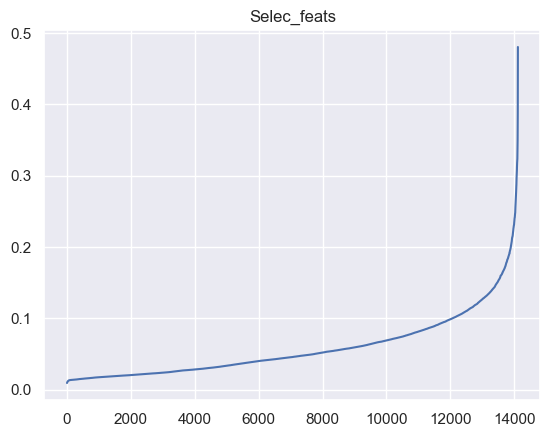

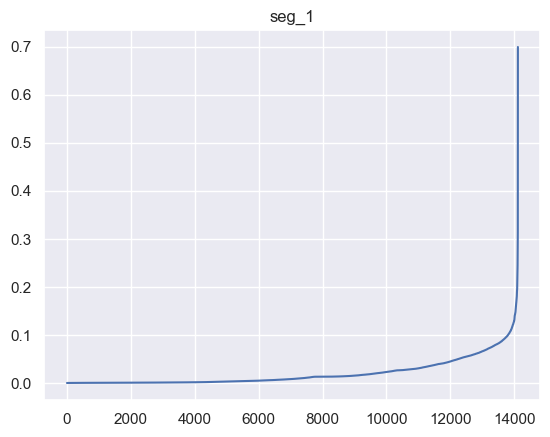

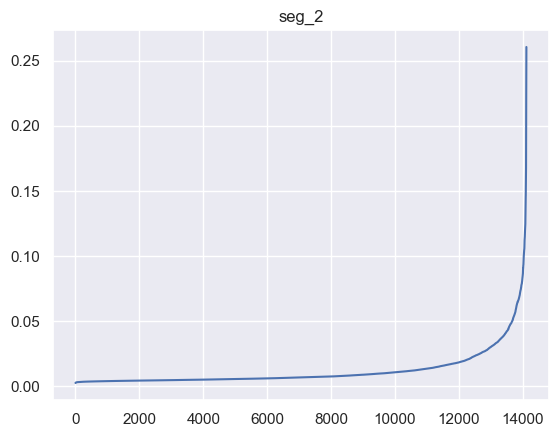

In [23]:
neigh=NearestNeighbors(n_neighbors=20)
neigh.fit(data_db[selec_feats])
distances, _ = neigh.kneighbors(data_db[selec_feats])
distances=np.sort(distances[:, -1])
plt.plot(distances)
plt.title("Selec_feats")
plt.show()

neigh=NearestNeighbors(n_neighbors=20)
neigh.fit(data_db[seg_1])
distances, _ = neigh.kneighbors(data_db[seg_1])
distances=np.sort(distances[:, -1])
plt.plot(distances)
plt.title("seg_1")
plt.show()

neigh=NearestNeighbors(n_neighbors=20)
neigh.fit(data_db[seg_2])
distances, _ = neigh.kneighbors(data_db[seg_2])
distances=np.sort(distances[:, -1])
plt.plot(distances)
plt.title("seg_2")
plt.show()

In [24]:
#Change the min_samples to 2x the number of features used

dbscan=DBSCAN(eps=.14, min_samples=8, n_jobs=4)
clusts_selec_feats=append_clust(data_db,selec_feats,cat_feats_all,'db_scan',cluster_algo=dbscan)
print('Outliers found in selected features:',round((clusts_selec_feats[clusts_selec_feats['db_scan']==-1].shape[0]/clusts_selec_feats.shape[0])*100,2),'%')

dbscan=DBSCAN(eps=0.08, min_samples=6, n_jobs=4)
clusts_seg_1=append_clust(data_db,seg_1,cat_feats_all,'db_scan',cluster_algo=dbscan)
print('Outliers found in segmentation 1:',round((clusts_seg_1[clusts_seg_1['db_scan']==-1].shape[0]/clusts_seg_1.shape[0])*100,2),'%')

dbscan=DBSCAN(eps=0.03, min_samples=4, n_jobs=4)
clusts_seg_2=append_clust(data_db,seg_2,cat_feats_all,'db_scan',cluster_algo=dbscan)
print('Outliers found in segmentation 2:',round((clusts_seg_2[clusts_seg_2['db_scan']==-1].shape[0]/clusts_seg_2.shape[0])*100,2),'%')

selec_feats_inds=pd.Series(clusts_selec_feats[clusts_selec_feats['db_scan']==-1].index)
seg_1_inds=pd.Series(clusts_seg_1[clusts_seg_1['db_scan']==-1].index)
seg_2_inds=pd.Series(clusts_seg_2[clusts_seg_2['db_scan']==-1].index)

out_indexes=pd.unique(pd.concat([selec_feats_inds, seg_1_inds,seg_2_inds]))
print("Total Outliers Found (not the sum since there can be repeated):",round((data_db.loc[out_indexes].shape[0]/data_db.shape[0])*100,2),'%')

Outliers found in selected features: 0.92 %
Outliers found in segmentation 1: 0.69 %
Outliers found in segmentation 2: 0.7 %
Total Outliers Found (not the sum since there can be repeated): 1.97 %


Remove the outliers when satisfied with dbscan result

In [25]:
outliers_scaled=pd.concat([outliers_scaled,data_eng_scaled.loc[out_indexes]])
data_eng_scaled.drop(out_indexes,inplace=True)

# Clustering

In [26]:
range_clusters=range(2,10)
data_concat=data_eng_scaled.copy()
r2_scores={}

## Inertia and Silhouette with K-means

#### Selected features

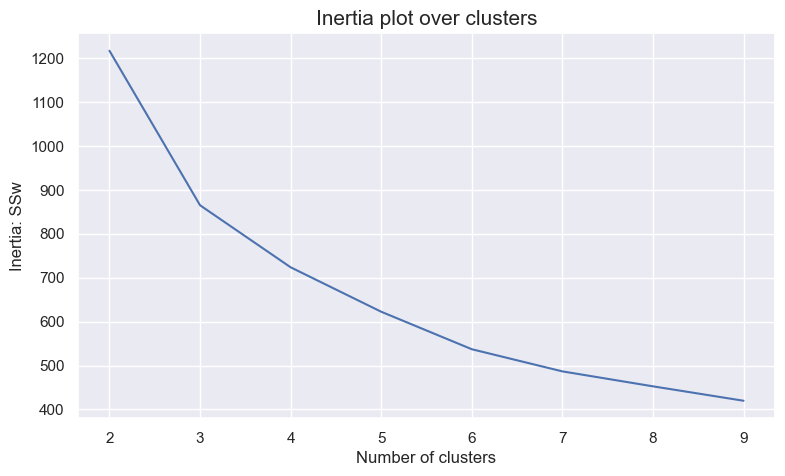

In [27]:
inertia(data_concat,selec_feats,range_clusters)

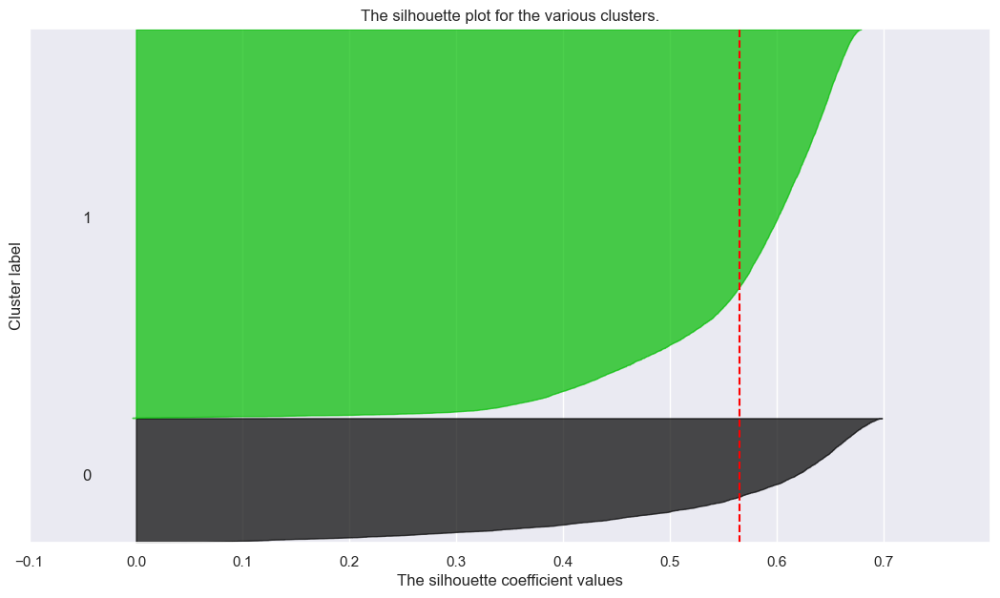

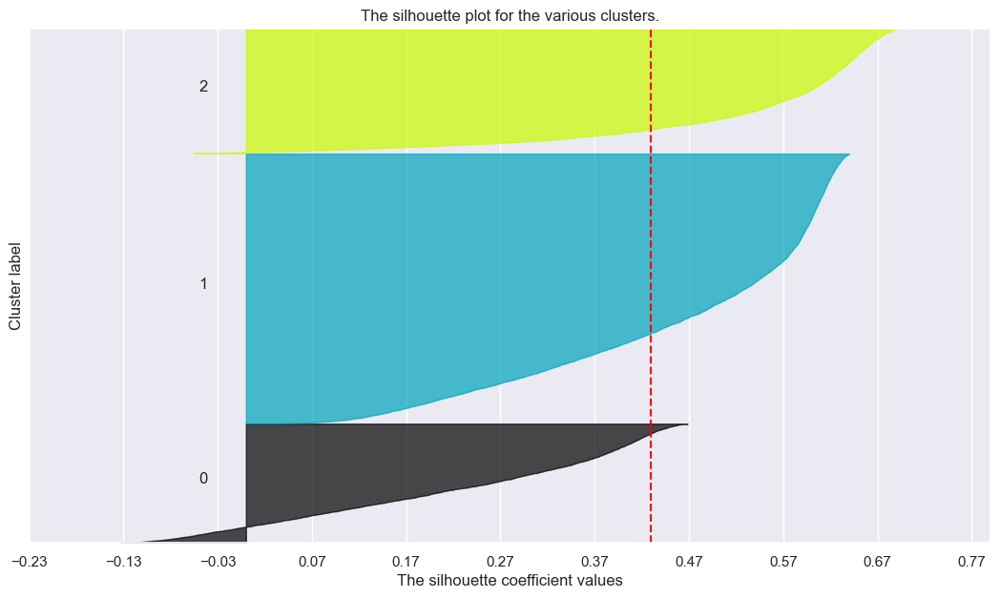

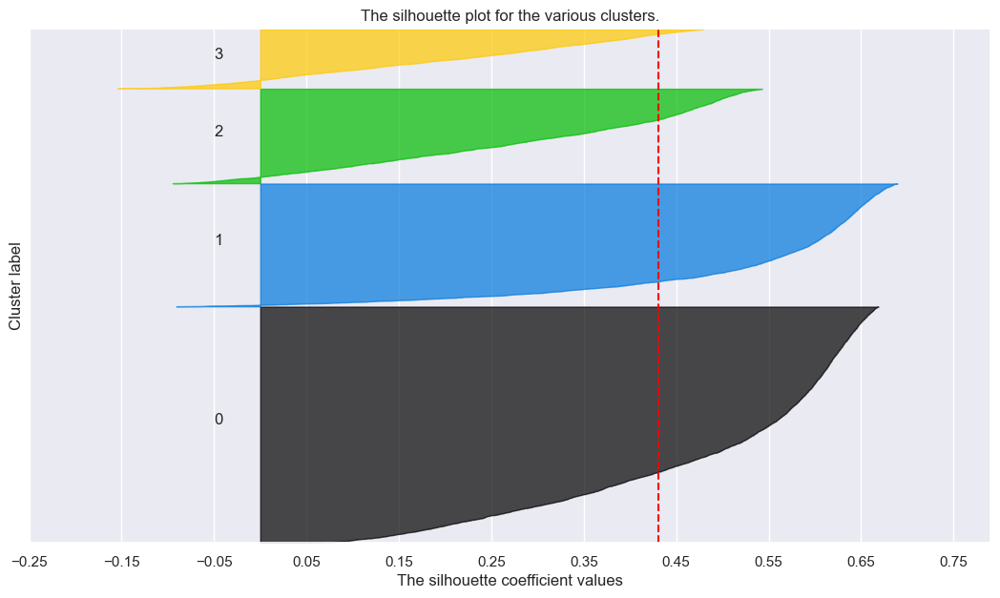

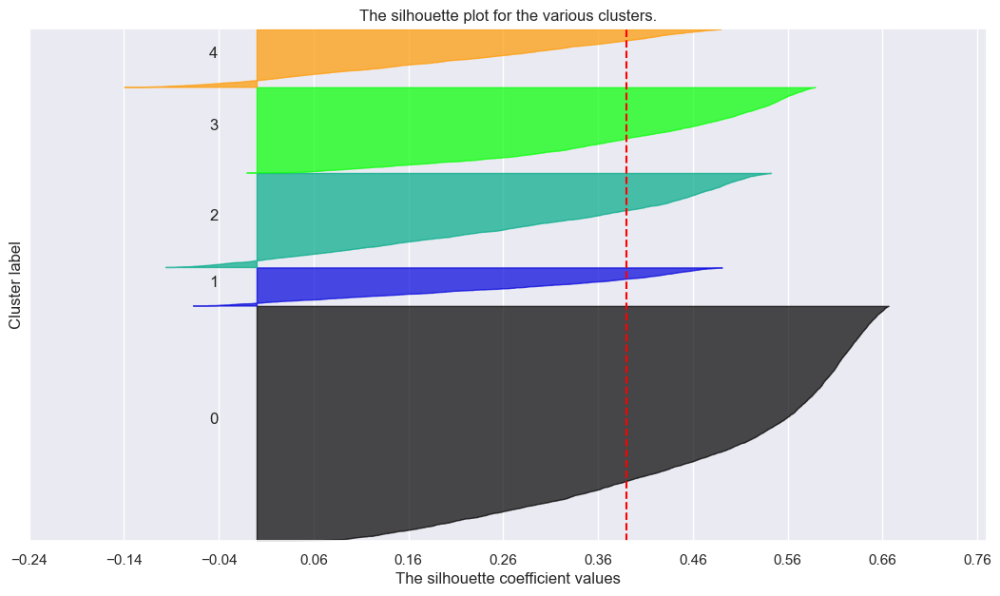

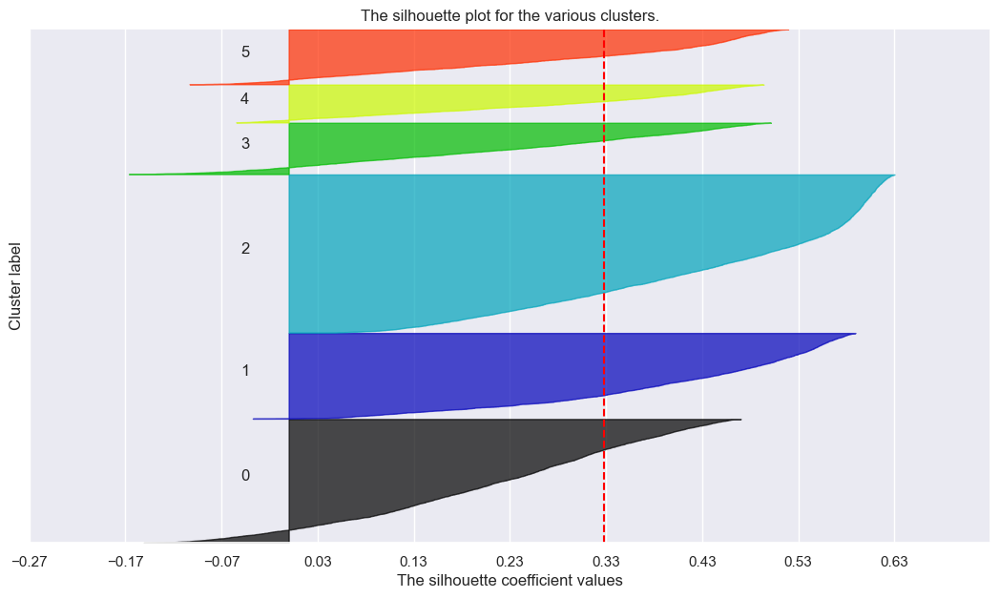

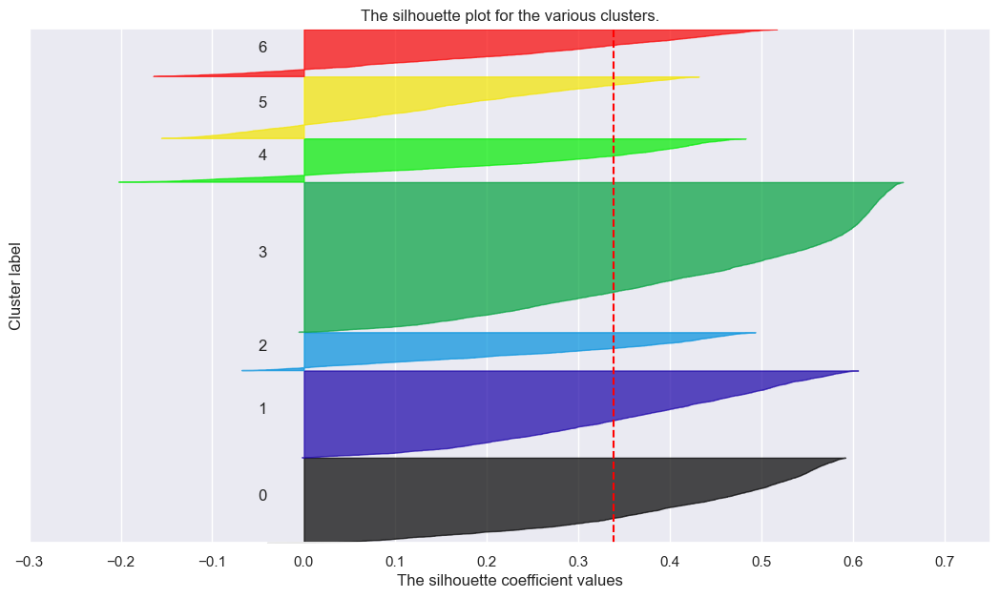

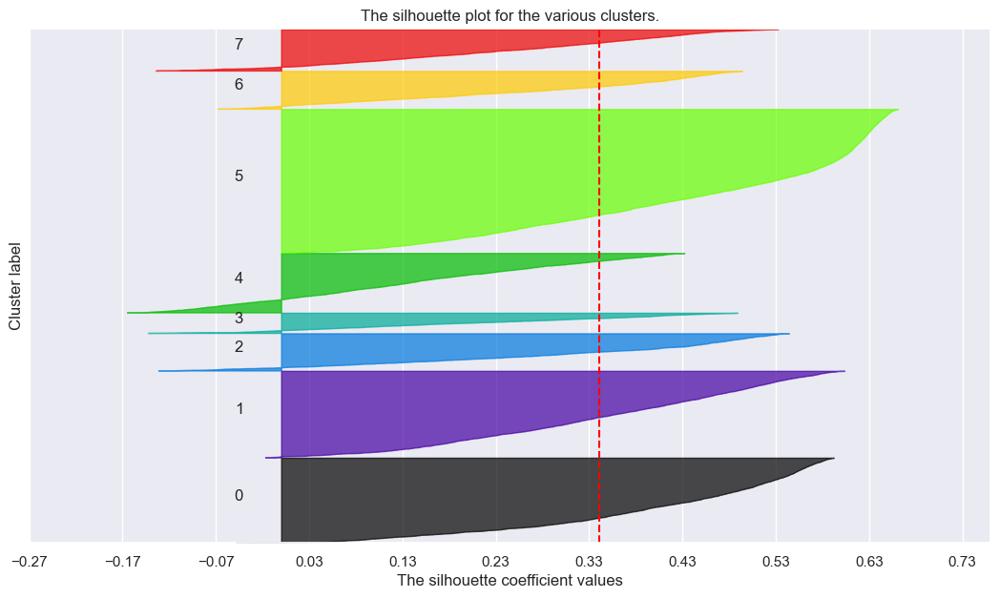

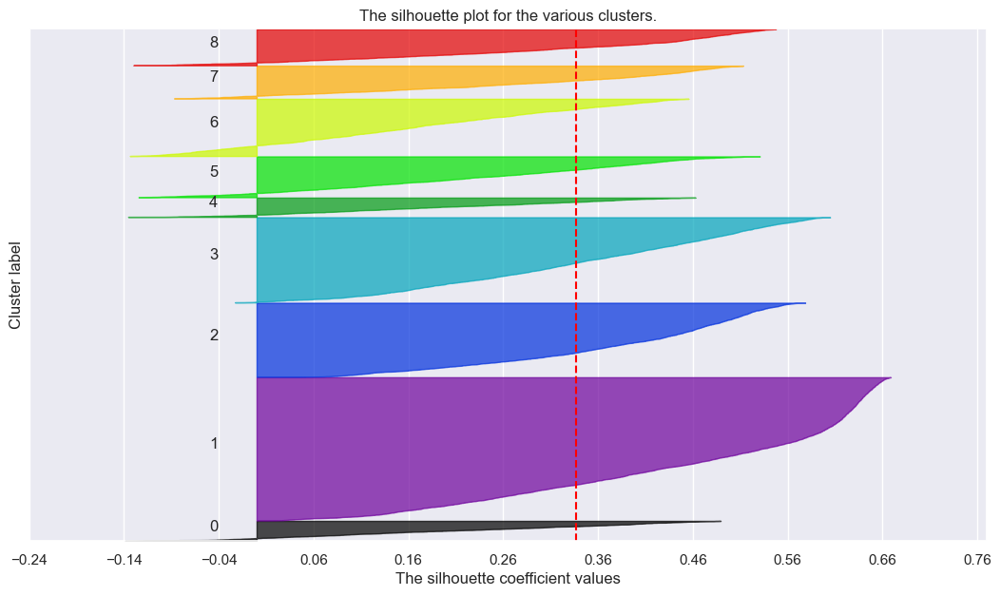

In [28]:
silhouette_graphs(data_concat,selec_feats,range_clusters)

#### Segmentation 1

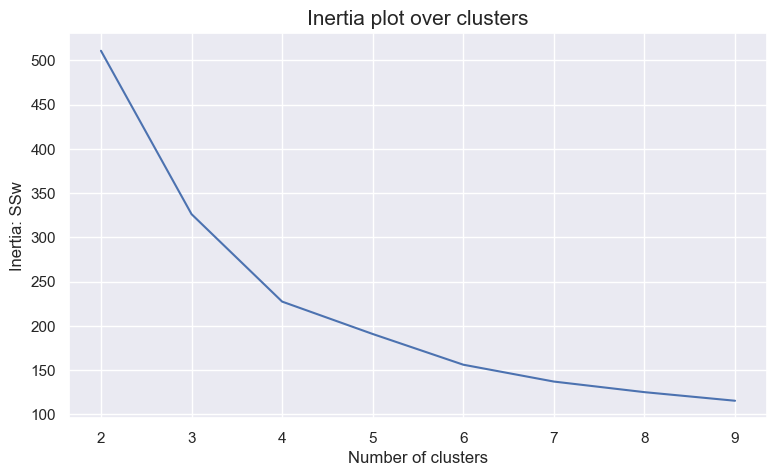

In [29]:
inertia(data_concat,seg_1,range_clusters)

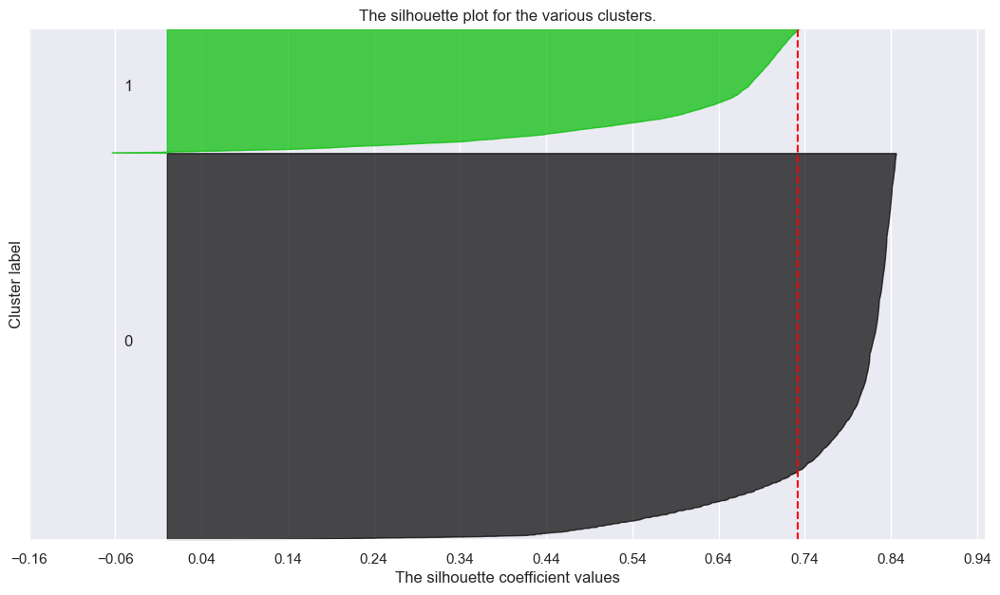

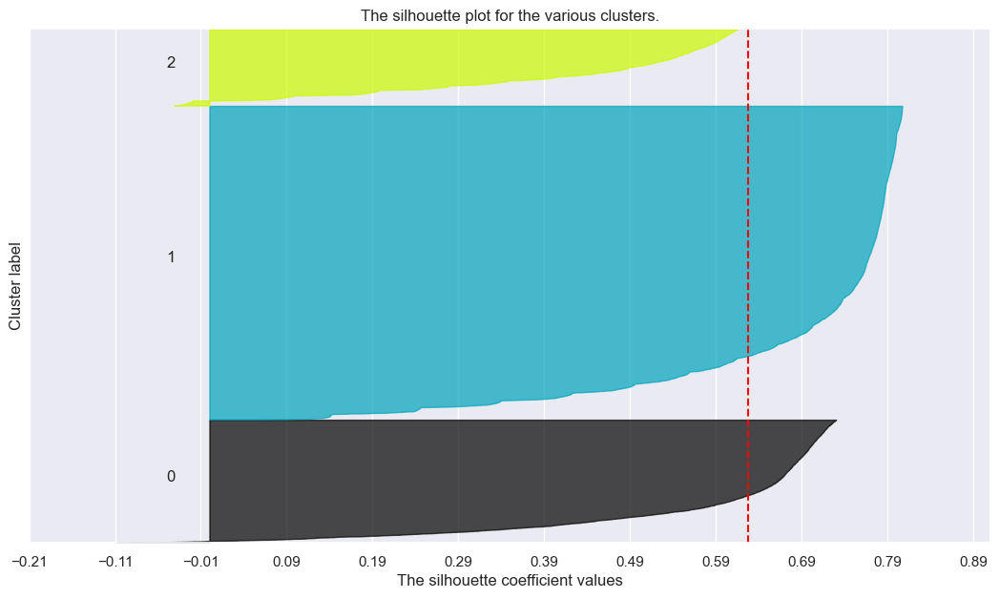

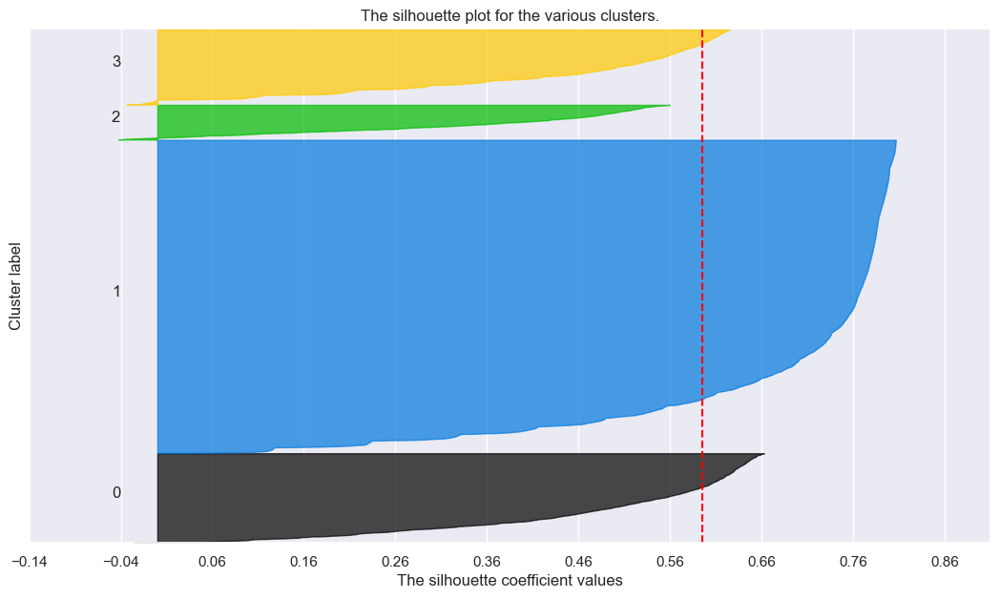

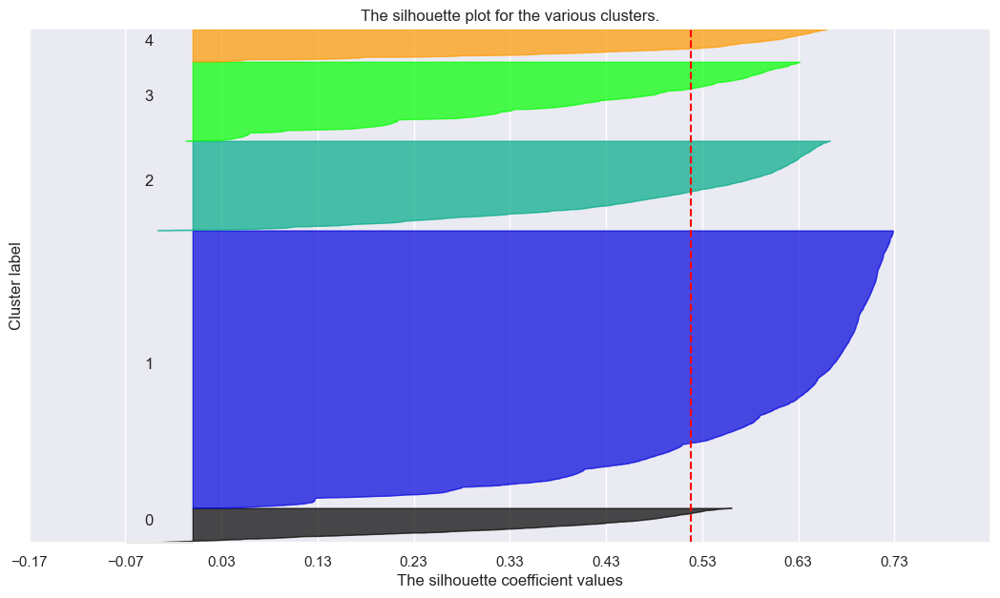

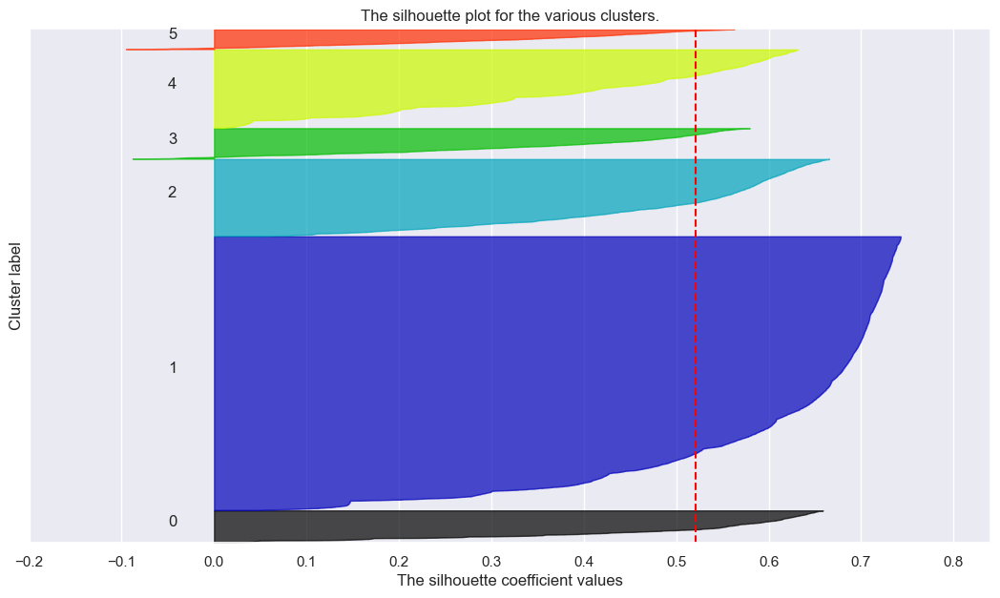

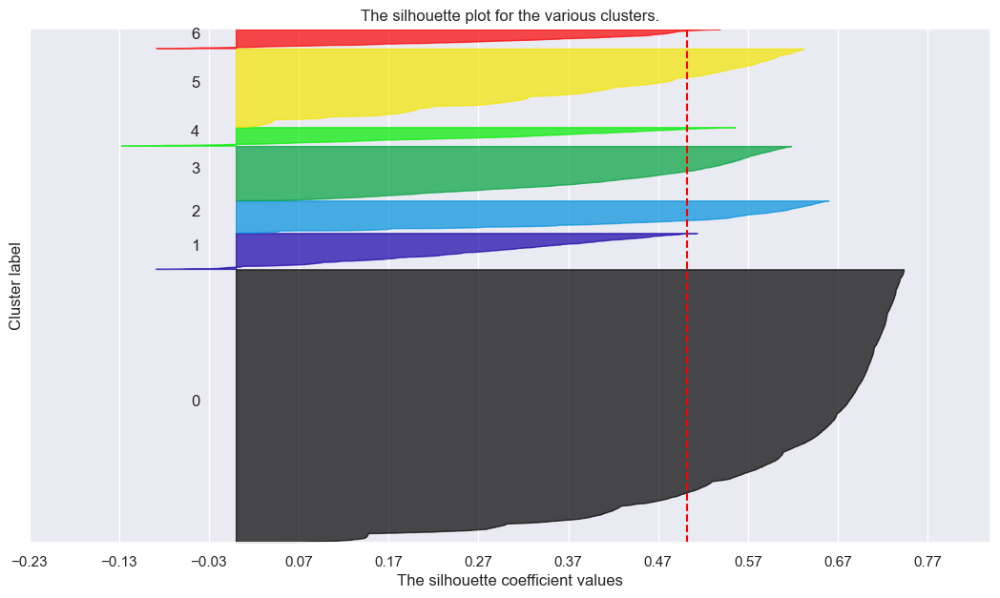

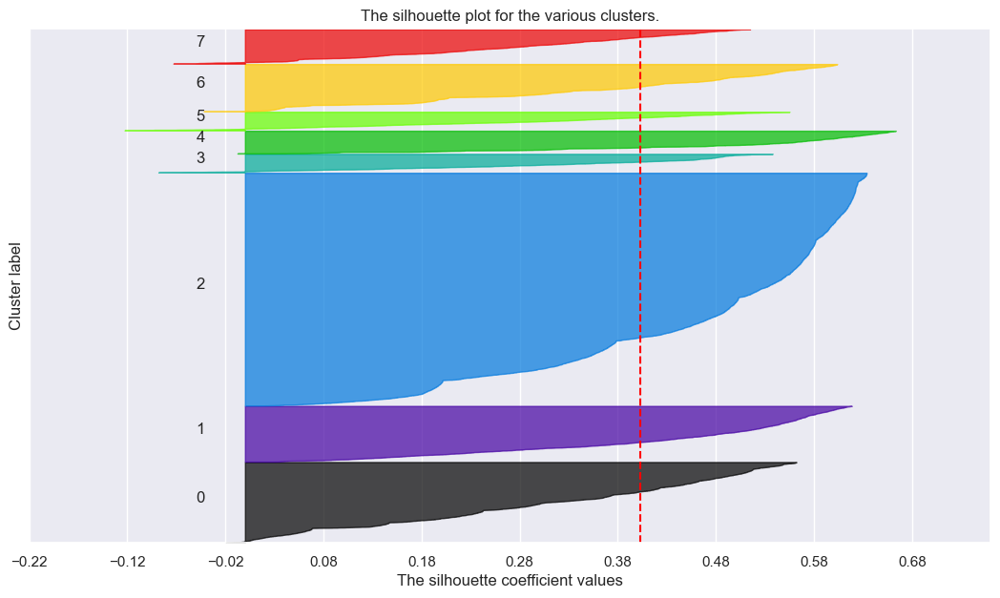

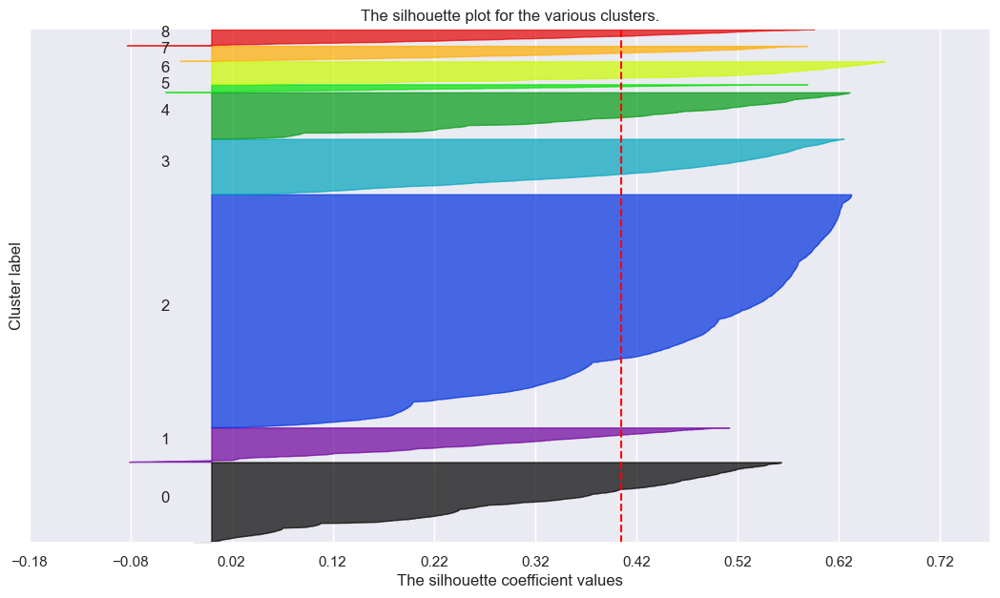

In [30]:
silhouette_graphs(data_concat,seg_1,range_clusters)

#### Segmentation 2

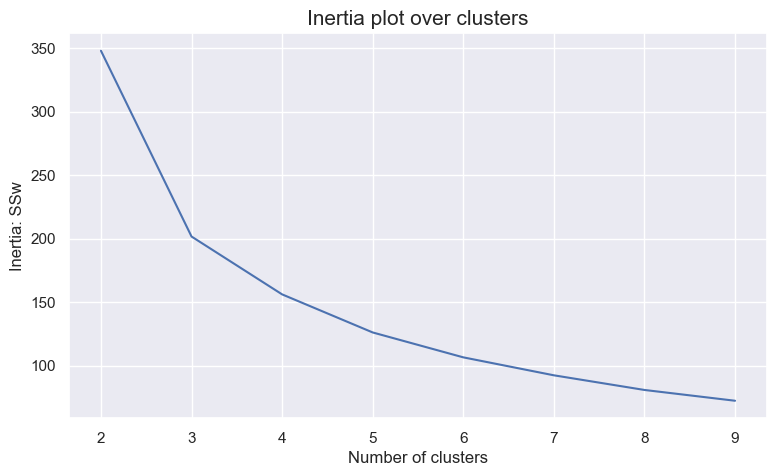

In [31]:
inertia(data_concat,seg_2,range_clusters)

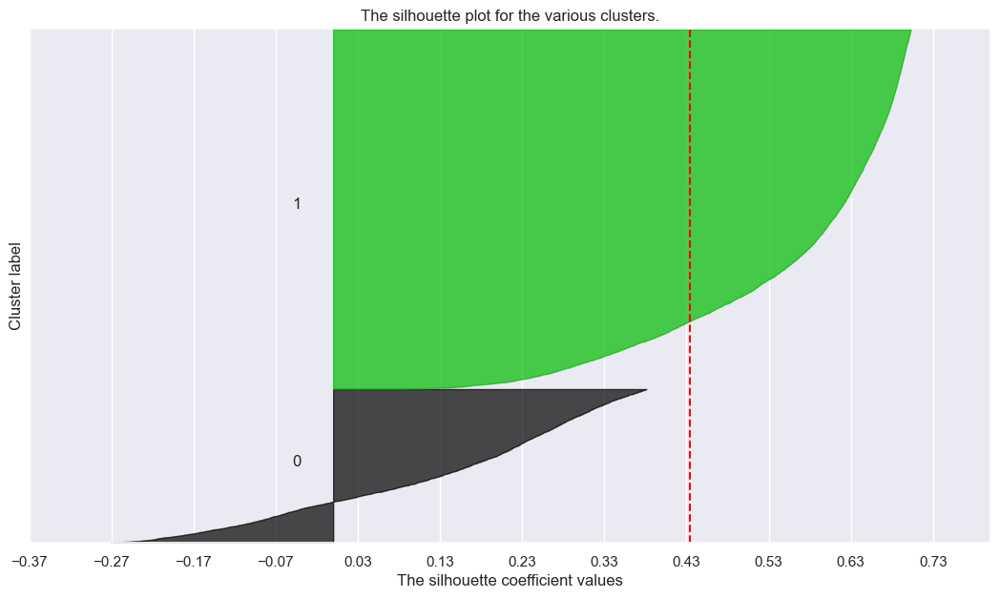

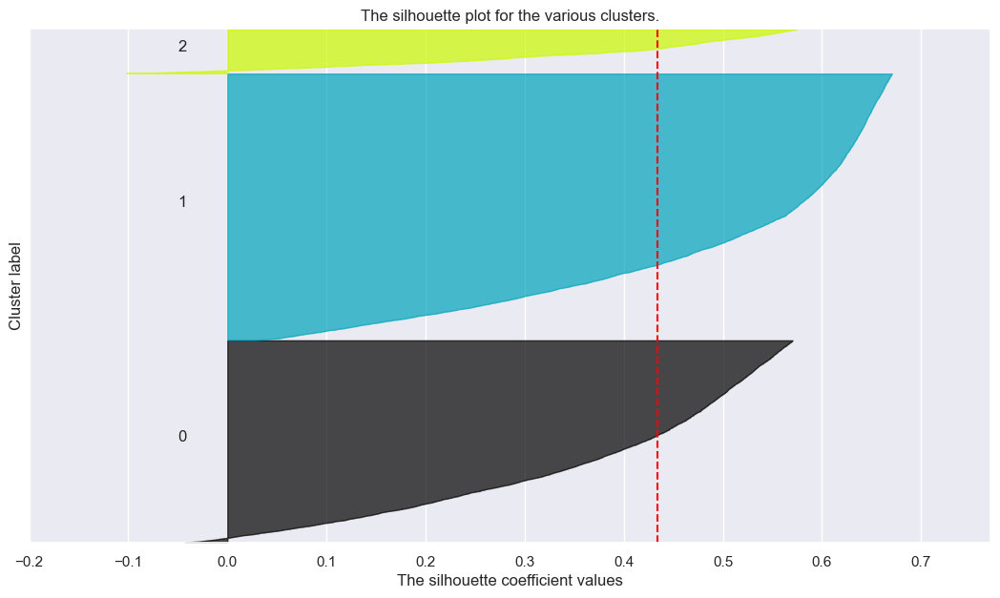

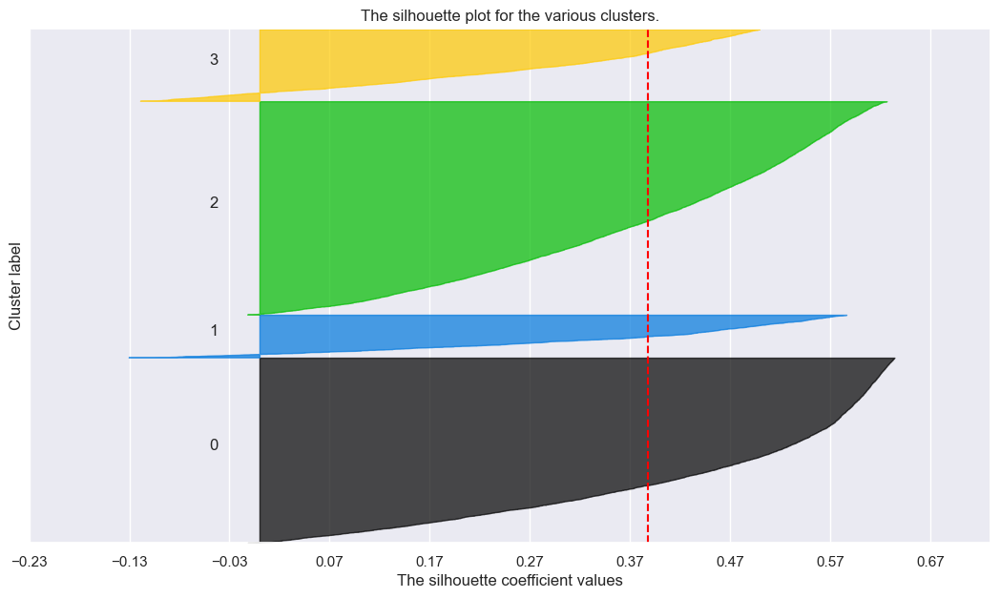

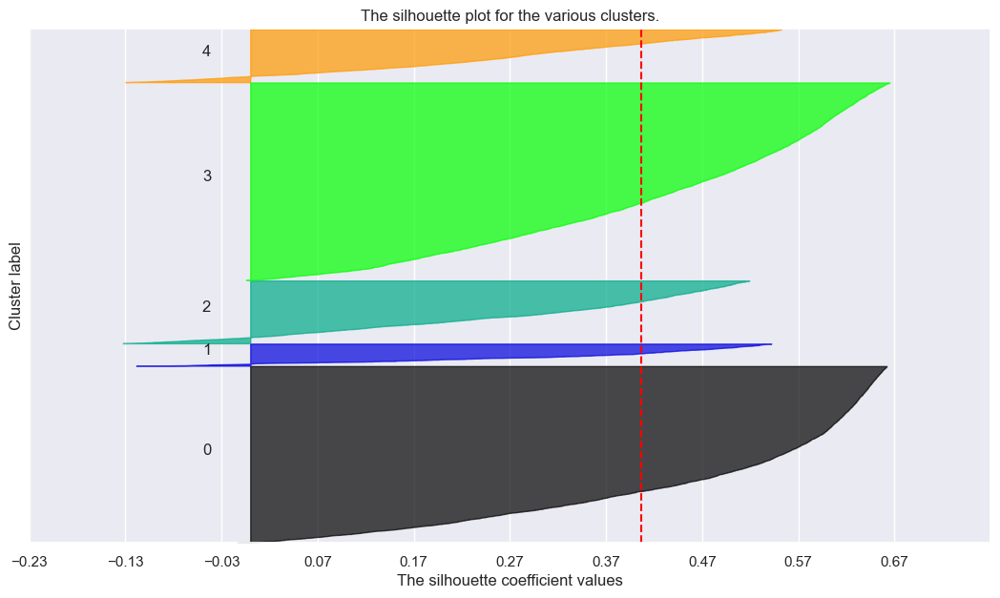

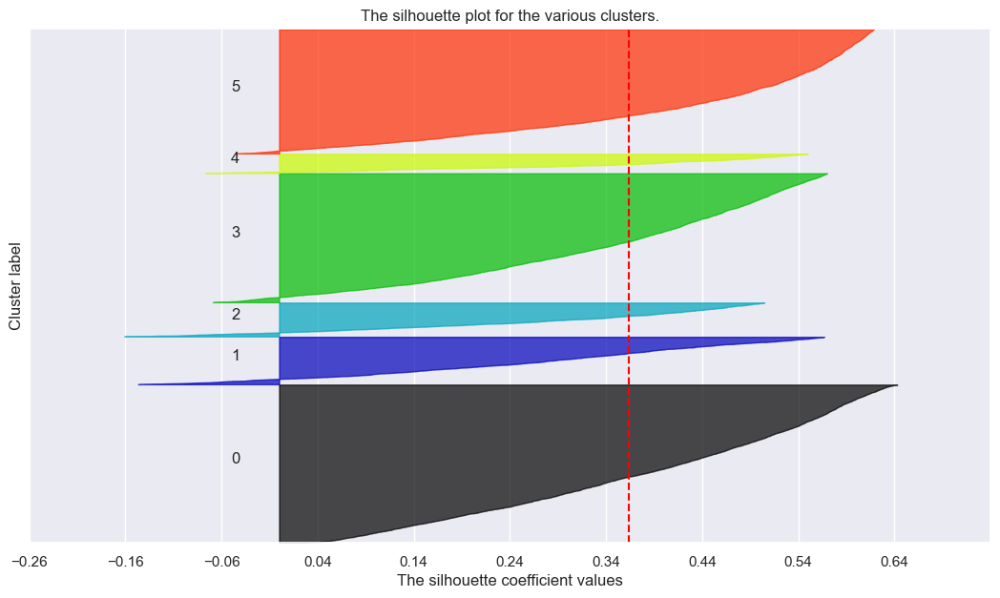

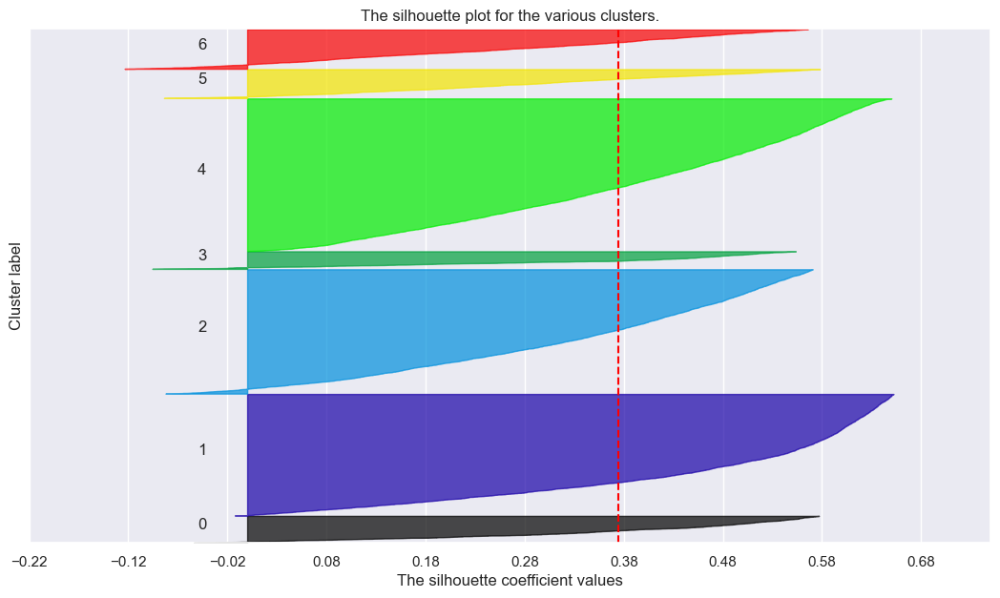

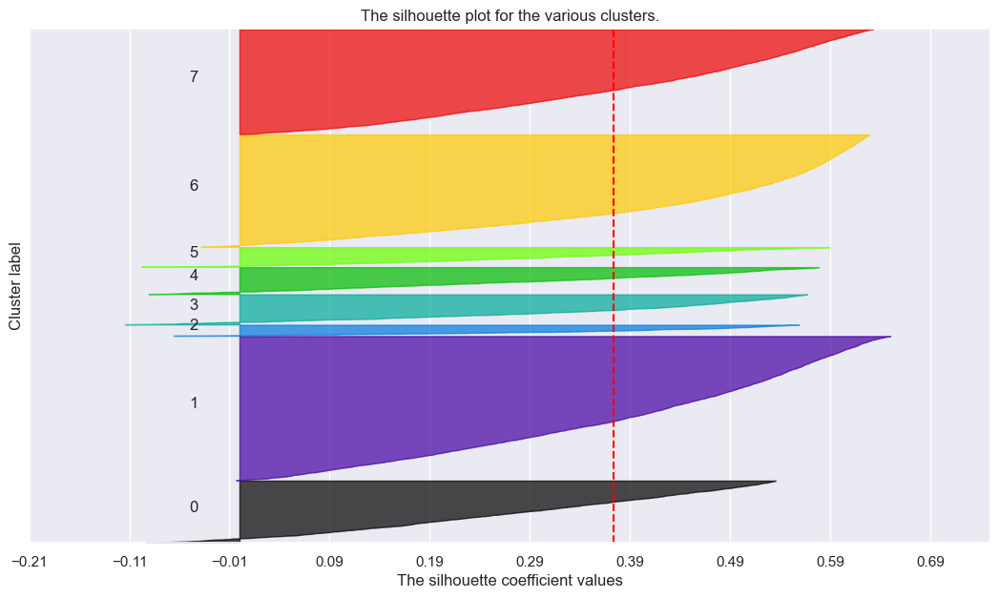

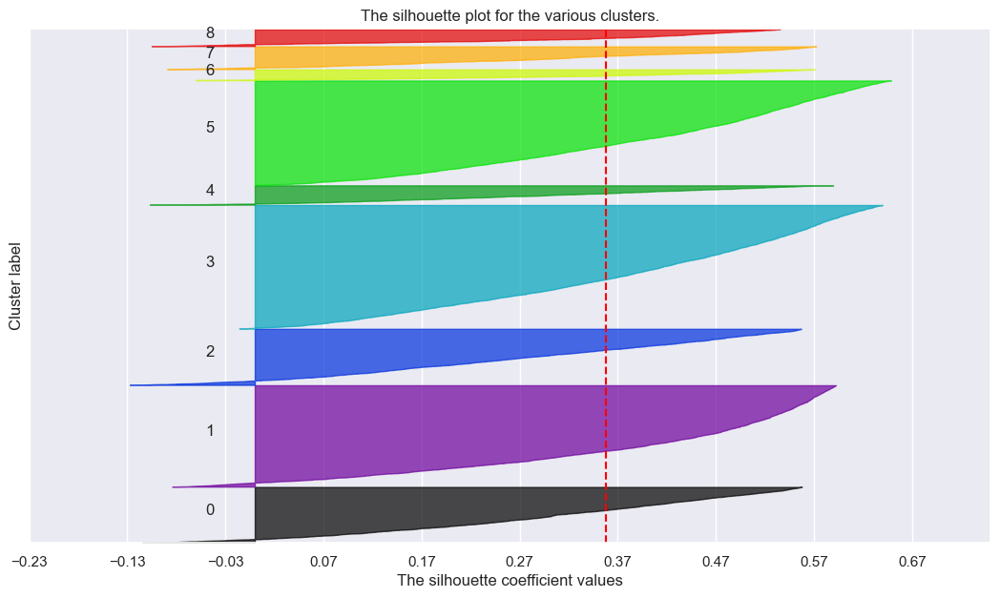

In [32]:
silhouette_graphs(data_concat,seg_2,range_clusters)

## Clustering algorithms

### K-Means

#### Selected Features

In [33]:
kmclust_5=KMeans(n_clusters=5,init="k-means++",n_init=300,random_state=42)

In [34]:
data_concat=append_clust(data_concat,selec_feats,cat_feats_all,"km_label_5",cluster_algo=kmclust_5)

r2_scores["km_label_5"]=r2(data_concat,selec_feats,"km_label_5")

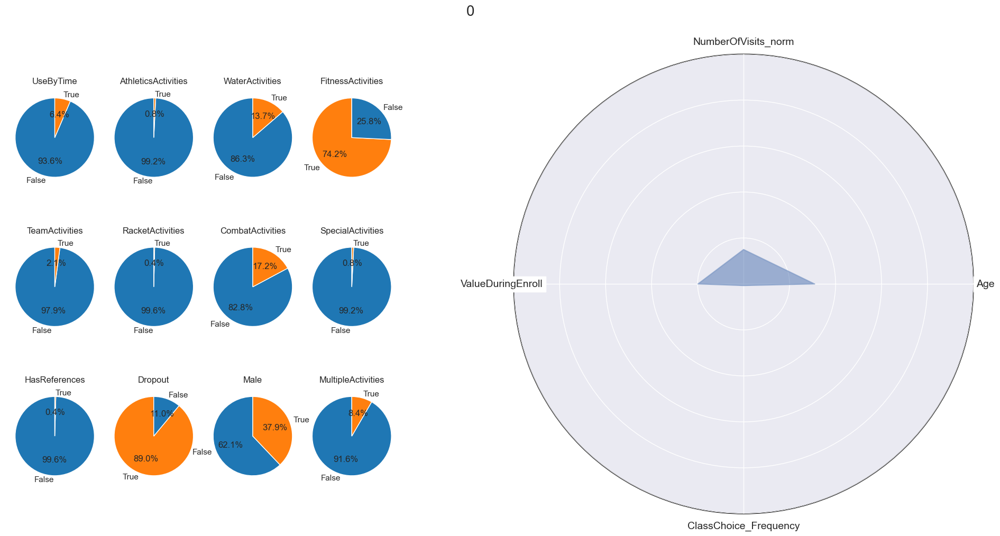

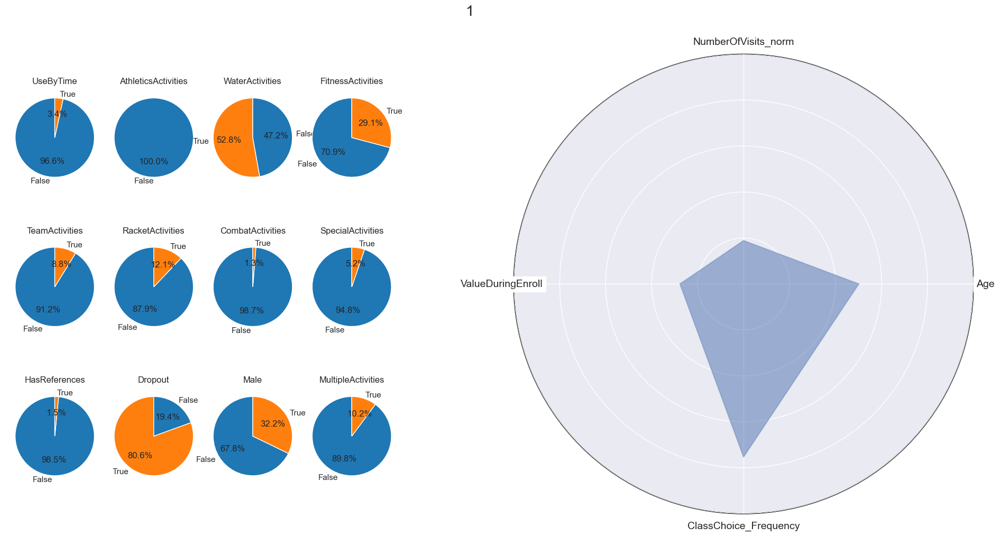

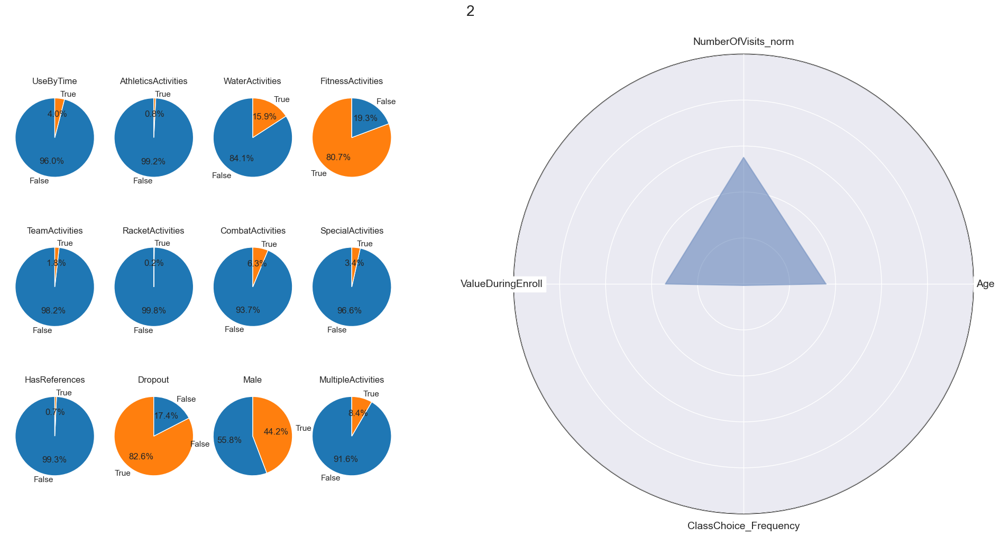

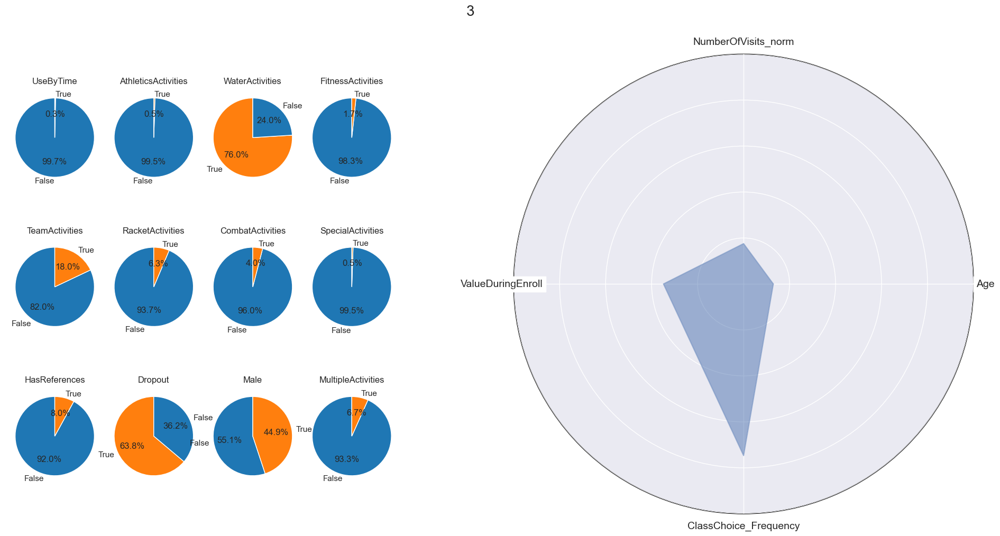

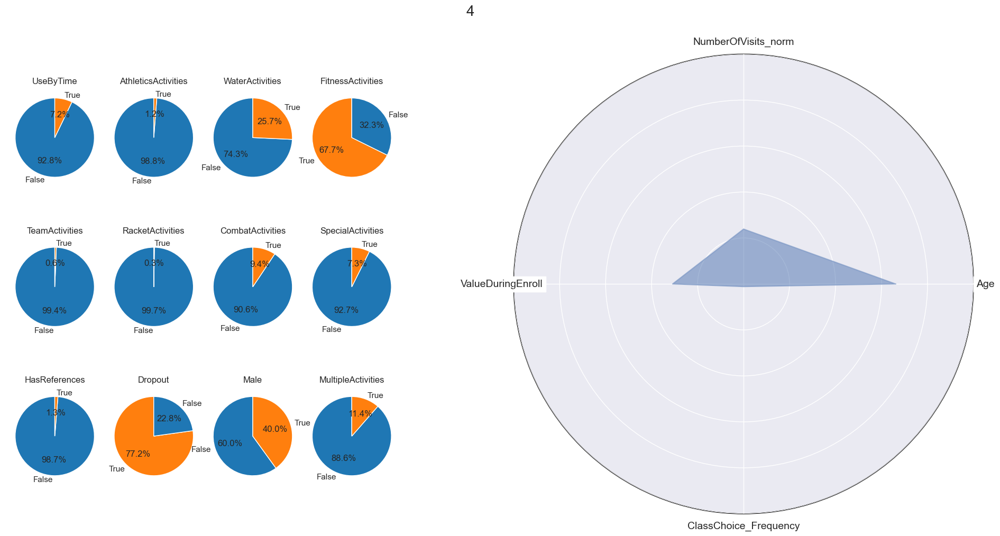

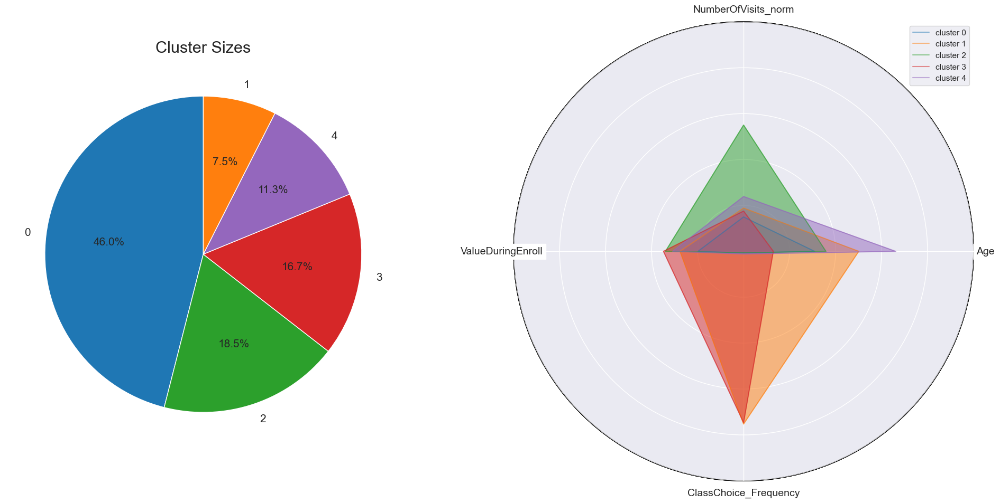

In [35]:
clust_profiles(data_concat,data_eng_out,"km_label_5",selec_feats,num_feats_all,cat_feats_all)

In [36]:
clust_profiles(data_concat,data_eng_out,"km_label_5",selec_feats,num_feats_all,cat_feats,group_by=True,used_scaler=scaler,group_all=True)


,km_label_5,0,1,2,3,4
Age,mean,23.15,37.57,26.85,9.70,49.59
Income,mean,1972.64,3451.48,2346.42,322.64,4529.27
DaysWithoutFrequency,mean,106.15,105.30,27.94,69.83,70.72
LifetimeValue,mean,173.09,390.35,261.65,594.71,339.66
NumberOfFrequencies,mean,21.93,40.24,69.88,43.08,46.18
AttendedClasses,mean,0.27,35.48,0.76,38.03,0.92
AllowedWeeklyVisitsBySLA,mean,6.81,2.81,6.93,2.47,6.86
AllowedNumberOfVisitsBySLA,mean,48.21,23.77,49.57,20.13,51.44
RealNumberOfVisits,mean,3.82,3.60,9.78,3.66,4.88
NumberOfRenewals,mean,1.08,1.56,0.73,1.81,1.32


#### Segmentation 1

In [37]:
kmclust_seg1=KMeans(n_clusters=3,init="k-means++",n_init=300,random_state=42)

In [38]:
data_concat=append_clust(data_concat,seg_1,cat_feats_all,"kmclust_seg1",cluster_algo=kmclust_seg1)

r2_scores["kmclust_seg1"]=r2(data_concat,seg_1,"kmclust_seg1")

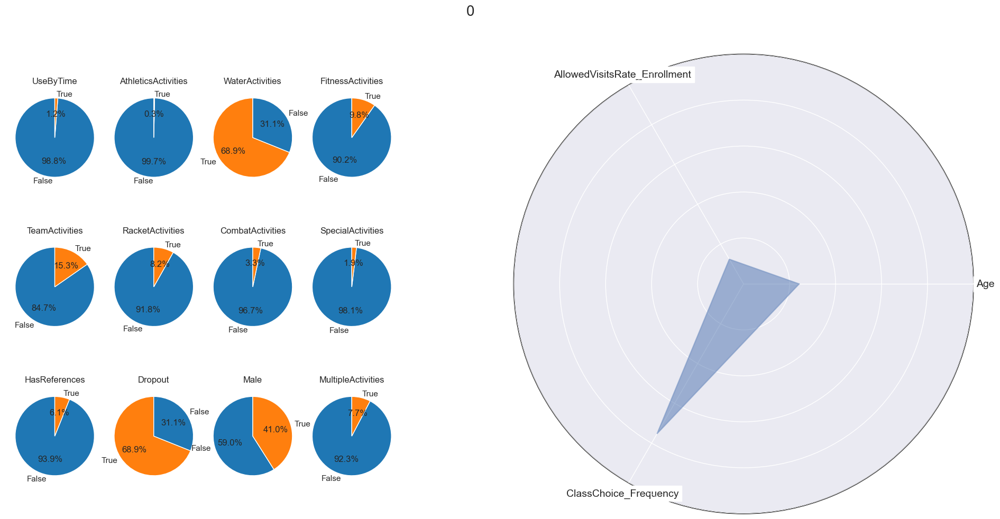

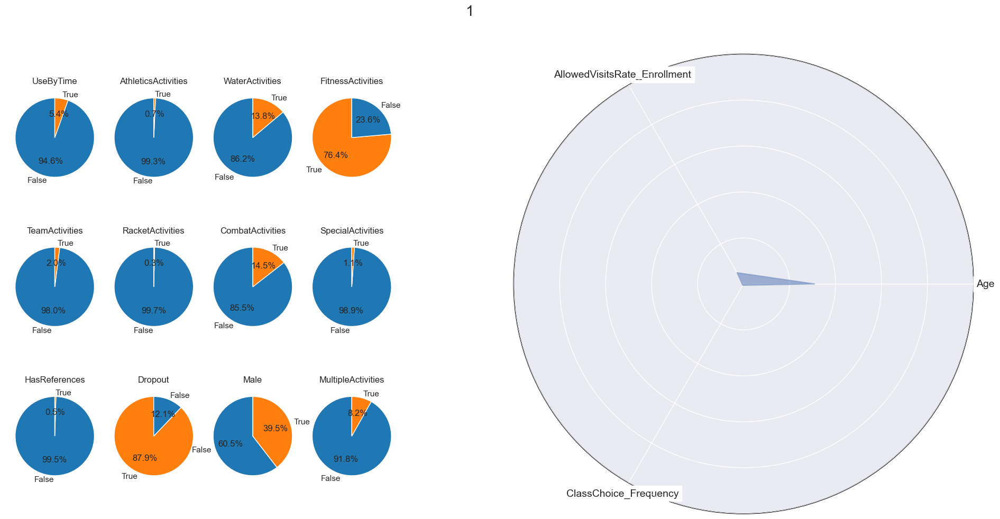

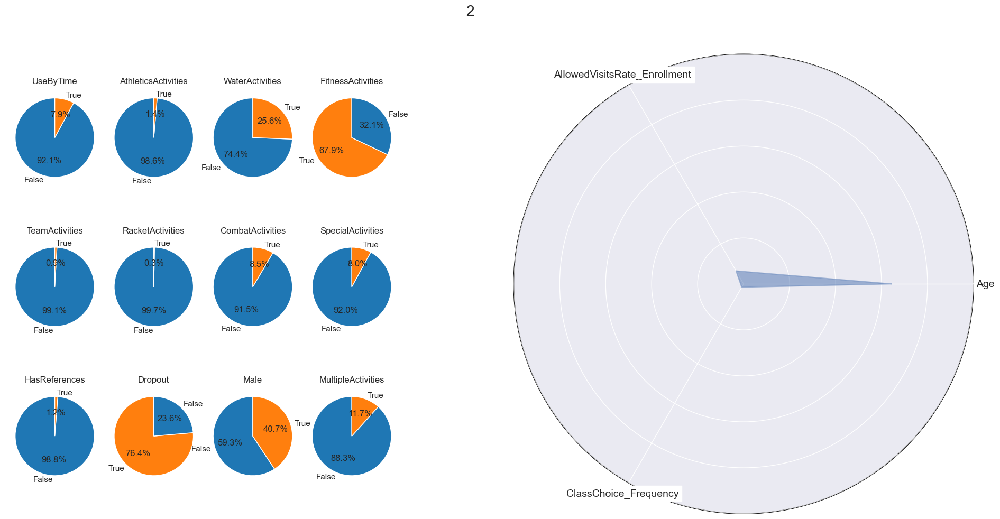

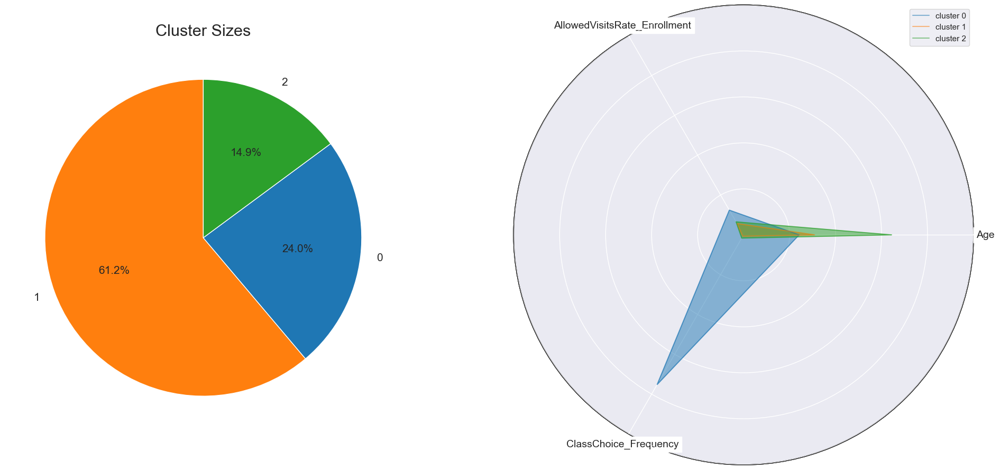

In [39]:
clust_profiles(data_concat,data_eng_out,"kmclust_seg1",seg_1,num_feats_all,cat_feats_all)

In [40]:
clust_profiles(data_concat,data_eng_out,"kmclust_seg1",seg_1,num_feats_all,cat_feats,group_by=True,used_scaler=scaler,group_all=True)


,kmclust_seg1,0,1,2
Age,mean,18.13,23.11,48.23
Income,mean,1270.61,1972.56,4400.18
DaysWithoutFrequency,mean,80.40,84.21,72.61
LifetimeValue,mean,532.30,187.94,353.25
NumberOfFrequencies,mean,42.45,32.22,57.46
AttendedClasses,mean,37.53,0.35,1.21
AllowedWeeklyVisitsBySLA,mean,2.58,6.84,6.83
AllowedNumberOfVisitsBySLA,mean,21.17,48.42,51.18
RealNumberOfVisits,mean,3.66,5.25,6.10
NumberOfRenewals,mean,1.73,0.95,1.39


#### Segmentation 2

In [41]:
kmclust_seg2=KMeans(n_clusters=3,init="k-means++",n_init=300,random_state=42)

In [42]:
data_concat=append_clust(data_concat,seg_2,cat_feats_all,"kmclust_seg2",cluster_algo=kmclust_seg2)

r2_scores["kmclust_seg2"]=r2(data_concat,seg_2,"kmclust_seg2")

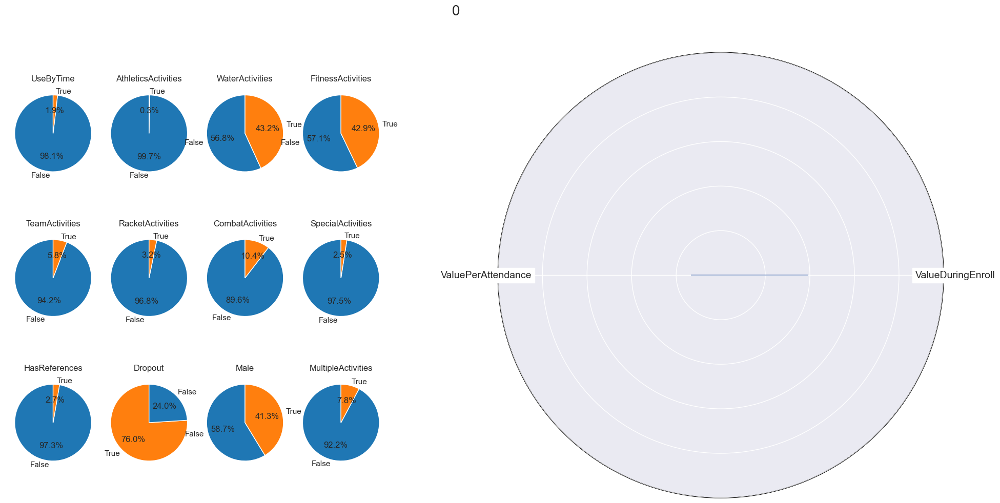

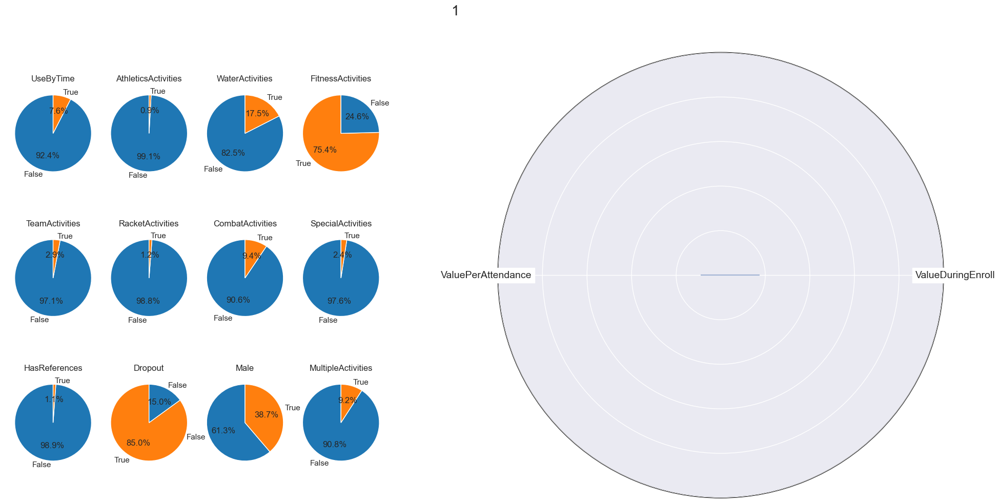

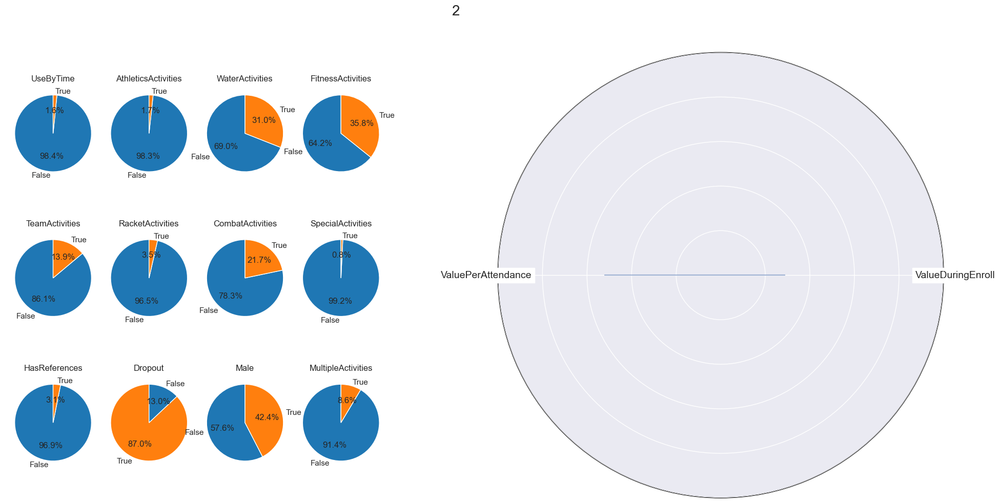

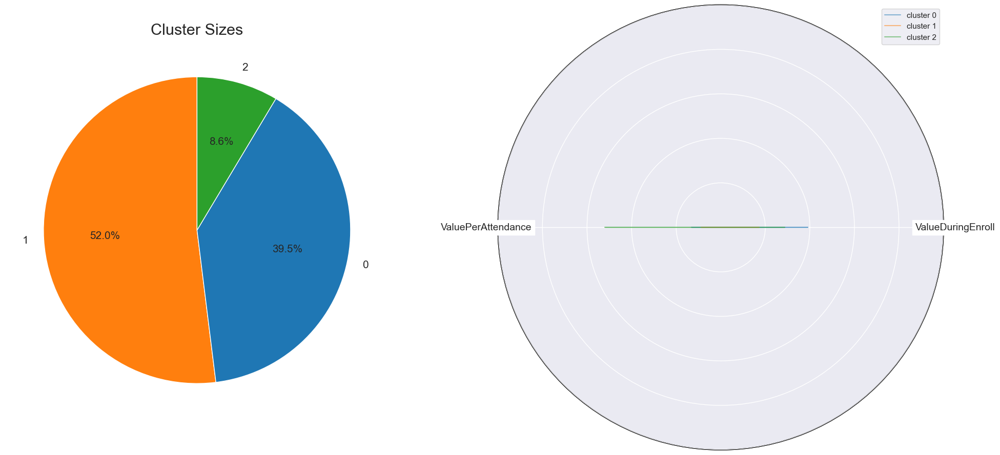

In [43]:
clust_profiles(data_concat,data_eng_out,"kmclust_seg2",seg_2,num_feats_all,cat_feats_all)

In [44]:
clust_profiles(data_concat,data_eng_out,"kmclust_seg2",seg_2,num_feats_all,cat_feats,group_by=True,used_scaler=scaler,group_all=True)


,kmclust_seg2,0,1,2
Age,mean,24.89,26.48,24.11
Income,mean,2042.24,2289.85,1978.22
DaysWithoutFrequency,mean,38.21,104.94,139.34
LifetimeValue,mean,397.37,230.26,217.01
NumberOfFrequencies,mean,42.03,41.28,4.65
AttendedClasses,mean,17.36,4.49,2.36
AllowedWeeklyVisitsBySLA,mean,5.20,6.41,5.02
AllowedNumberOfVisitsBySLA,mean,38.86,45.66,37.80
RealNumberOfVisits,mean,5.27,5.47,0.87
NumberOfRenewals,mean,0.97,1.42,0.93


### Hierarquical Clustering

#### Selected features

In [45]:
hclust_5=AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=5)


In [46]:
data_concat=append_clust(data_concat,selec_feats,cat_feats_all,"hclust_5",cluster_algo=hclust_5)

r2_scores["hclust_5"]=r2(data_concat,selec_feats,"hclust_5")

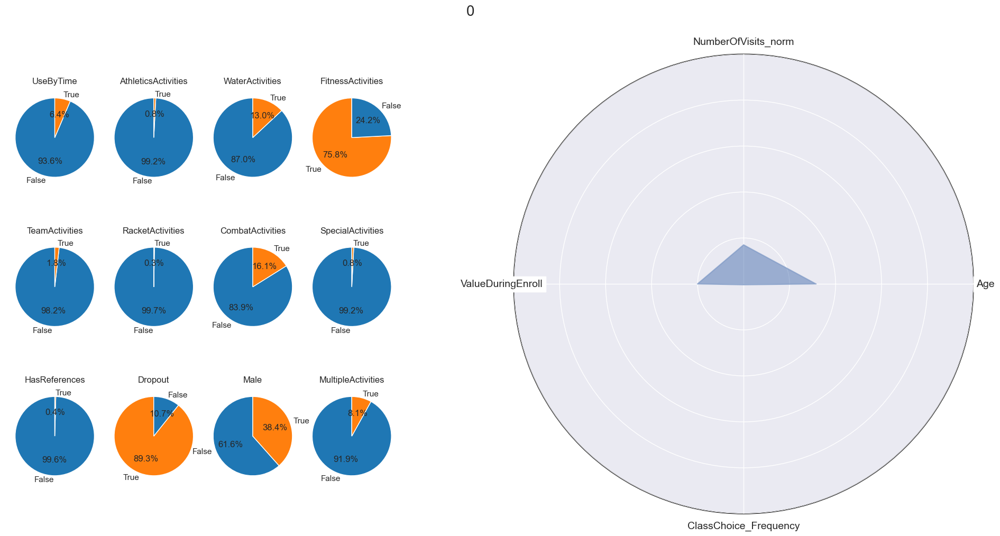

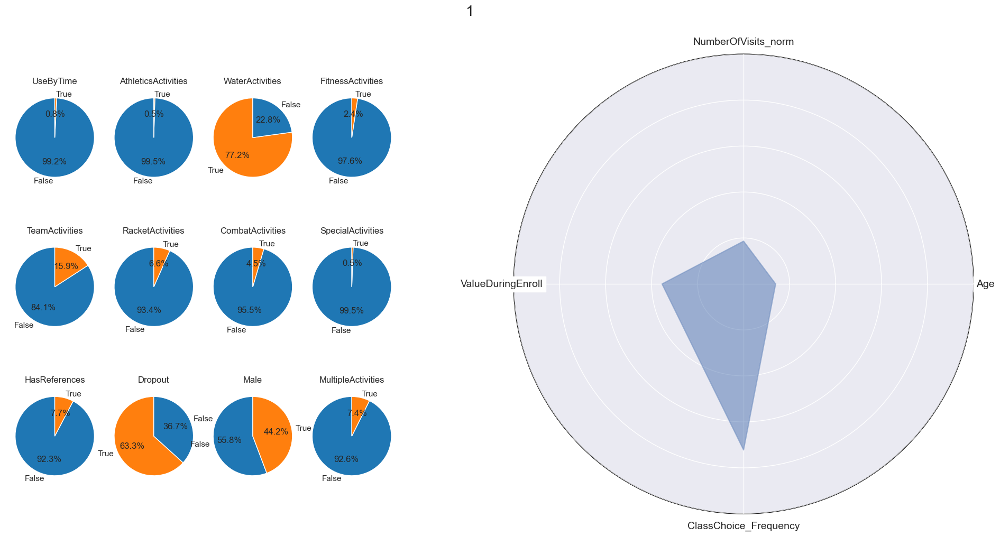

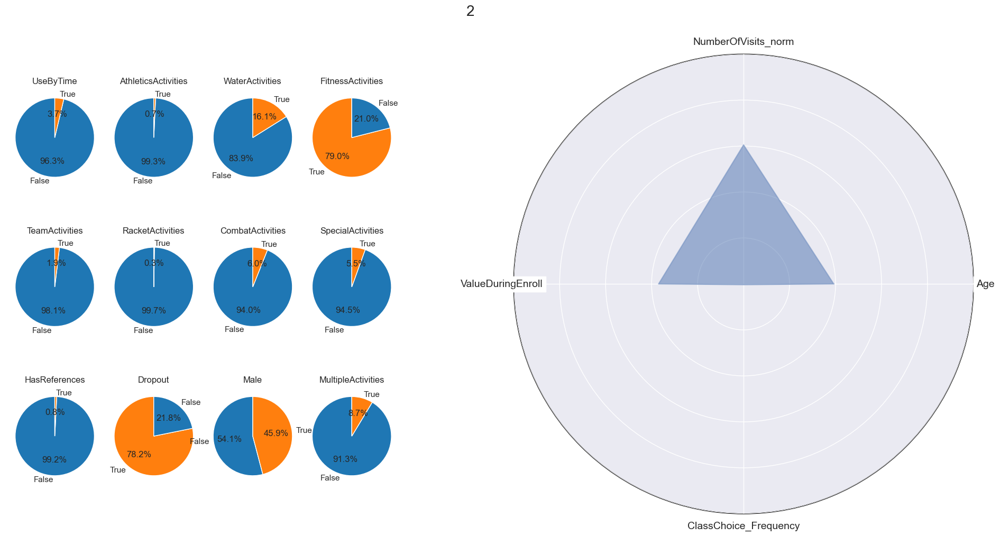

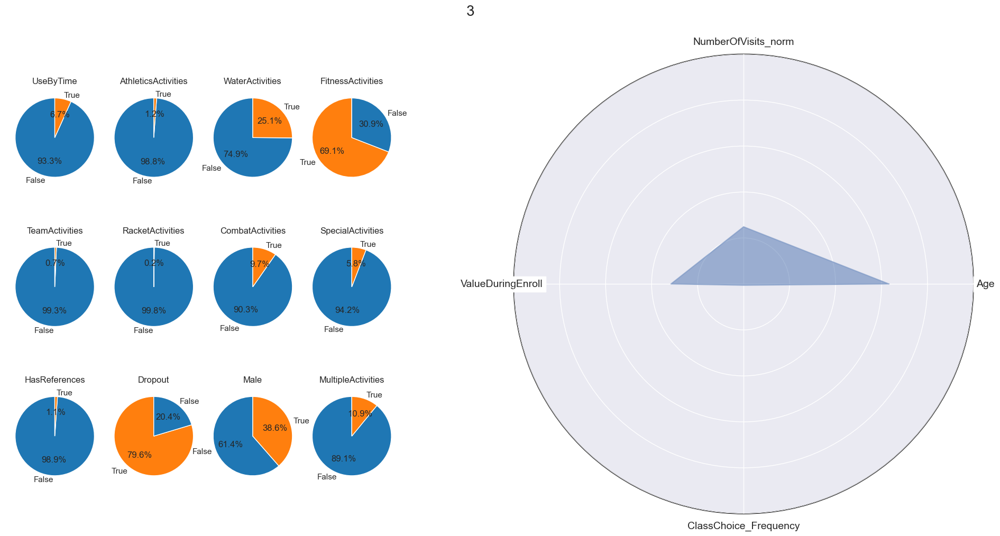

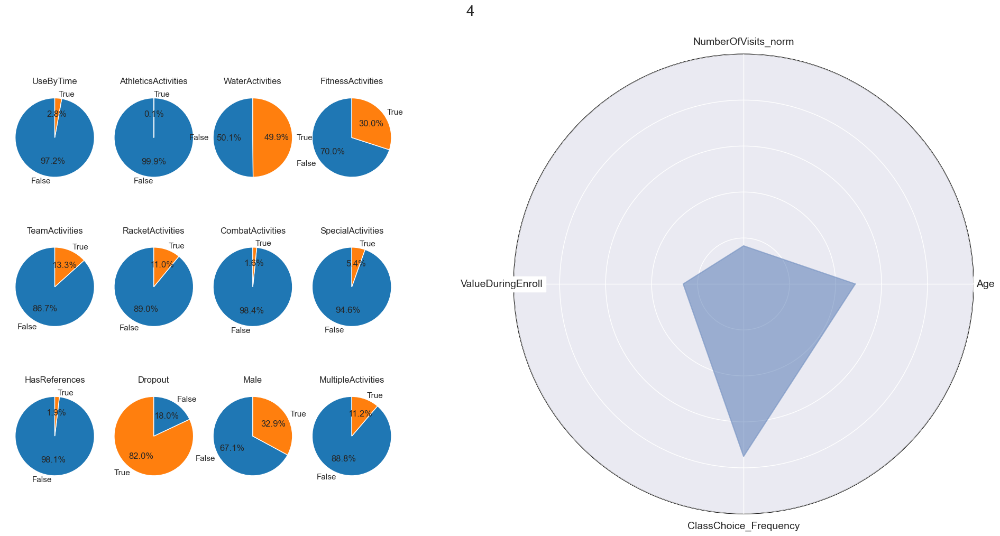

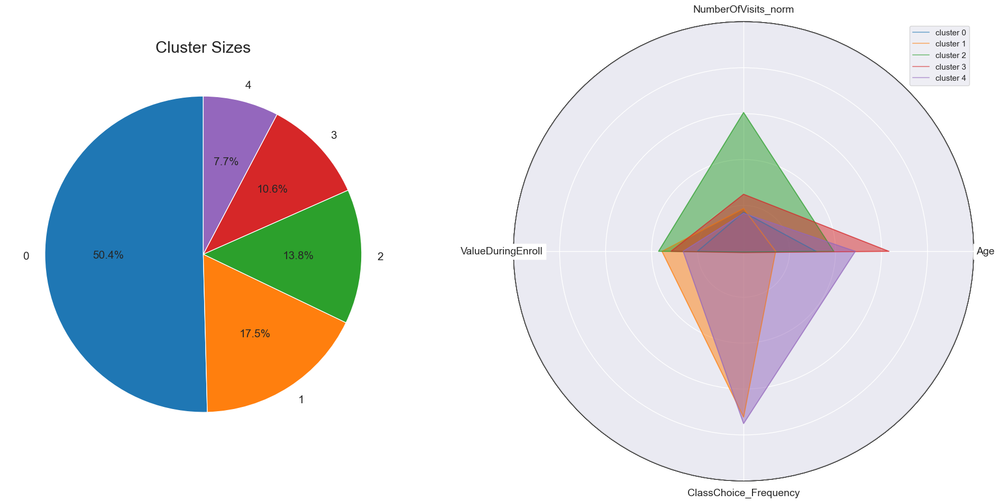

In [47]:
clust_profiles(data_concat,data_eng_out,"hclust_5",selec_feats,num_feats_all,cat_feats_all)

In [48]:
clust_profiles(data_concat,data_eng_out,"hclust_5",selec_feats,num_feats_all,cat_feats_all, group_by=True,used_scaler=scaler, group_all=True)

,hclust_5,0,1,2,3,4
Age,mean,23.64,10.46,29.41,47.40,36.44
Income,mean,2024.80,421.02,2582.22,4333.77,3296.38
DaysWithoutFrequency,mean,102.38,63.64,22.96,63.26,116.12
LifetimeValue,mean,173.44,591.53,282.18,336.09,385.13
NumberOfFrequencies,mean,24.36,44.69,77.28,46.04,36.29
AttendedClasses,mean,0.20,38.64,0.46,0.54,31.34
AllowedWeeklyVisitsBySLA,mean,6.86,2.52,6.95,6.89,2.91
AllowedNumberOfVisitsBySLA,mean,48.82,20.37,48.83,51.75,24.64
RealNumberOfVisits,mean,4.14,3.85,10.79,4.72,3.23
NumberOfRenewals,mean,1.06,1.78,0.72,1.24,1.62


#### Segmentation 1

In [49]:
hclust_seg1=AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=3)

In [50]:
data_concat=append_clust(data_concat,seg_1,cat_feats_all,"hclust_seg1",cluster_algo=hclust_seg1)

r2_scores["hclust_seg1"]=r2(data_concat,seg_1,"hclust_seg1")

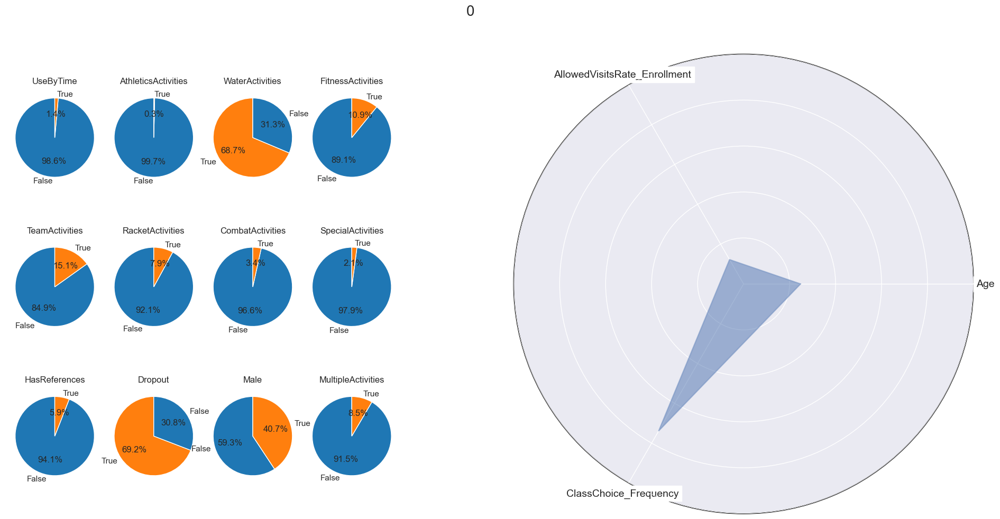

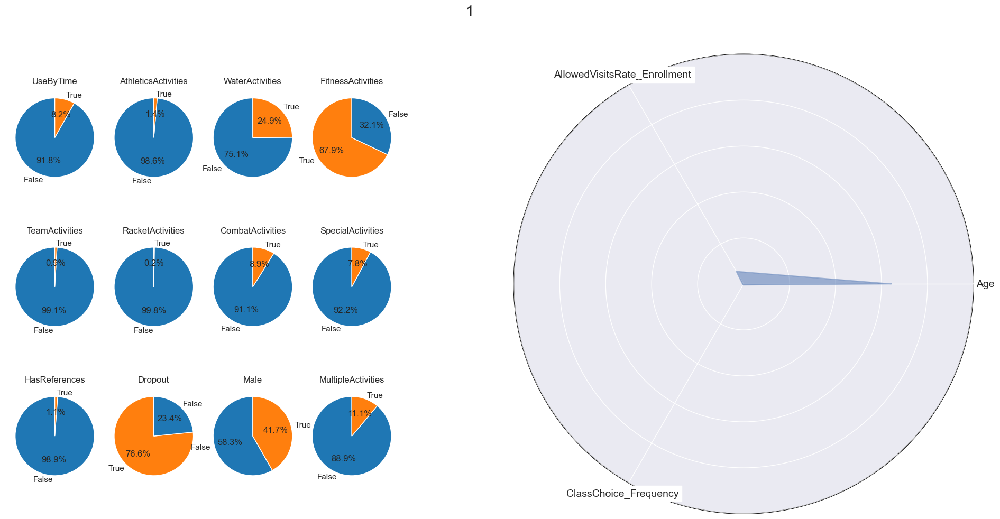

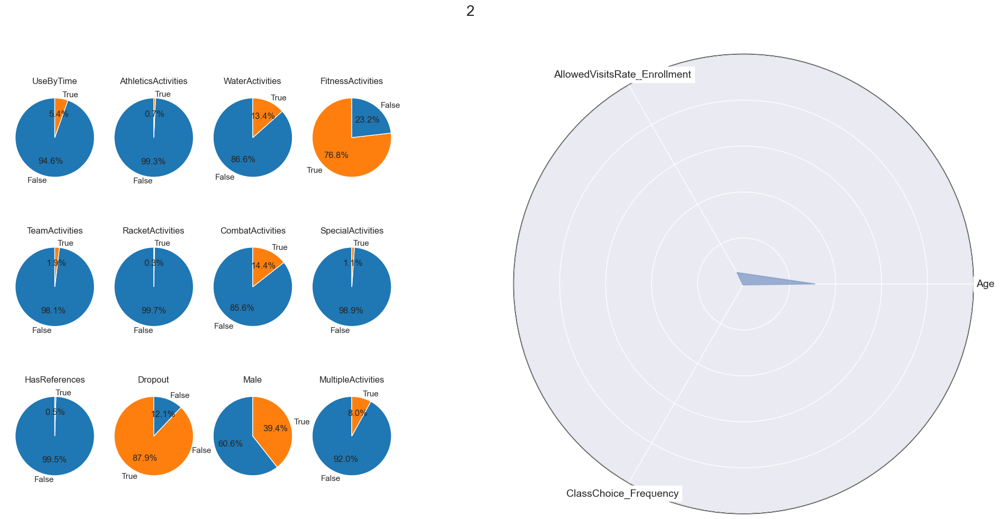

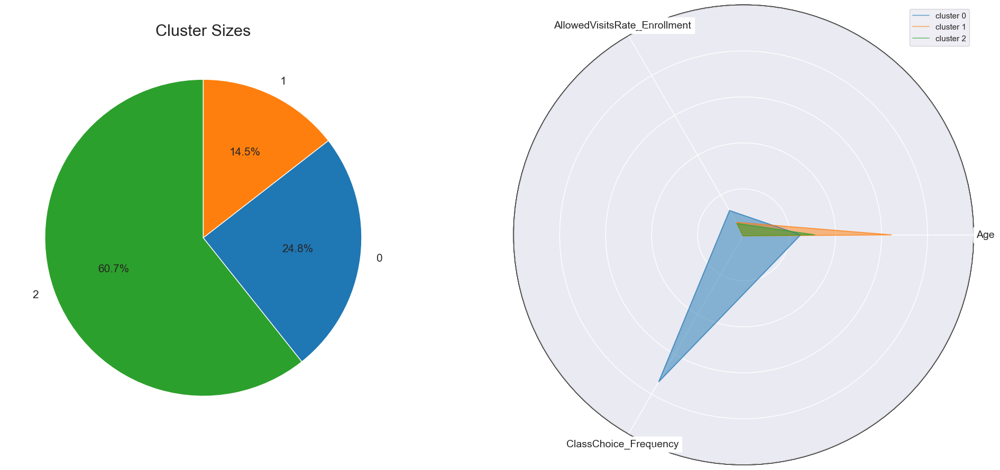

In [51]:
clust_profiles(data_concat,data_eng_out,"hclust_seg1",seg_1,num_feats_all,cat_feats_all)

In [52]:
clust_profiles(data_concat,data_eng_out,"hclust_seg1",seg_1,num_feats_all,cat_feats,group_by=True,used_scaler=scaler,group_all=True)


,hclust_seg1,0,1,2
Age,mean,18.59,48.15,23.17
Income,mean,1317.94,4394.88,1979.66
DaysWithoutFrequency,mean,80.08,75.08,83.73
LifetimeValue,mean,531.72,343.83,186.63
NumberOfFrequencies,mean,42.57,55.73,32.61
AttendedClasses,mean,36.88,0.51,0.26
AllowedWeeklyVisitsBySLA,mean,2.63,6.90,6.86
AllowedNumberOfVisitsBySLA,mean,21.66,51.52,48.54
RealNumberOfVisits,mean,3.66,6.02,5.30
NumberOfRenewals,mean,1.74,1.38,0.94


#### Segmentation 2

In [53]:
hclust_seg2=AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=3)

In [54]:
data_concat=append_clust(data_concat,seg_2,cat_feats_all,"hclust_seg2",cluster_algo=hclust_seg2)

r2_scores["hclust_seg2"]=r2(data_concat,seg_2,"hclust_seg2")

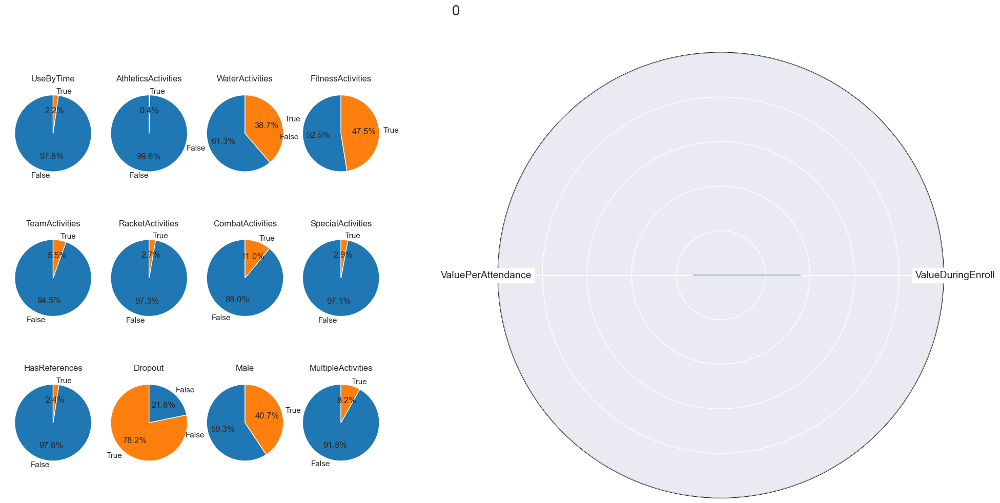

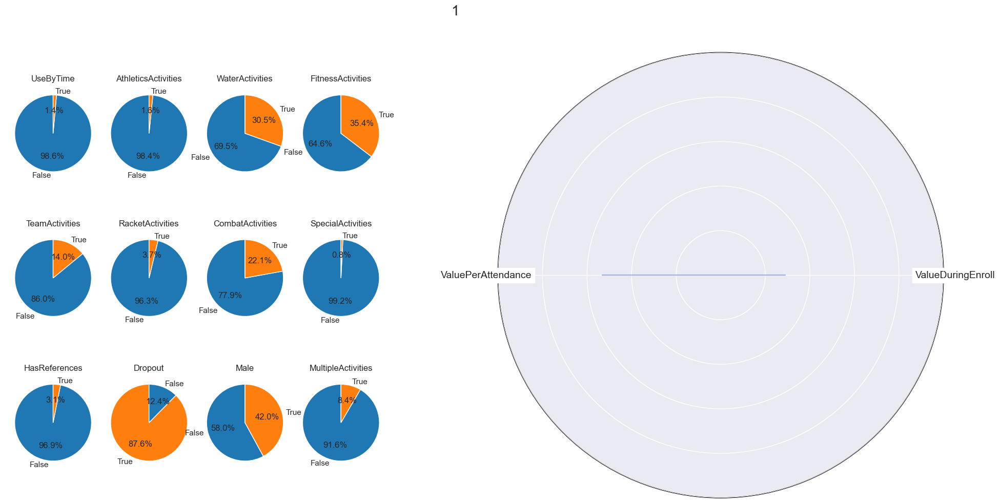

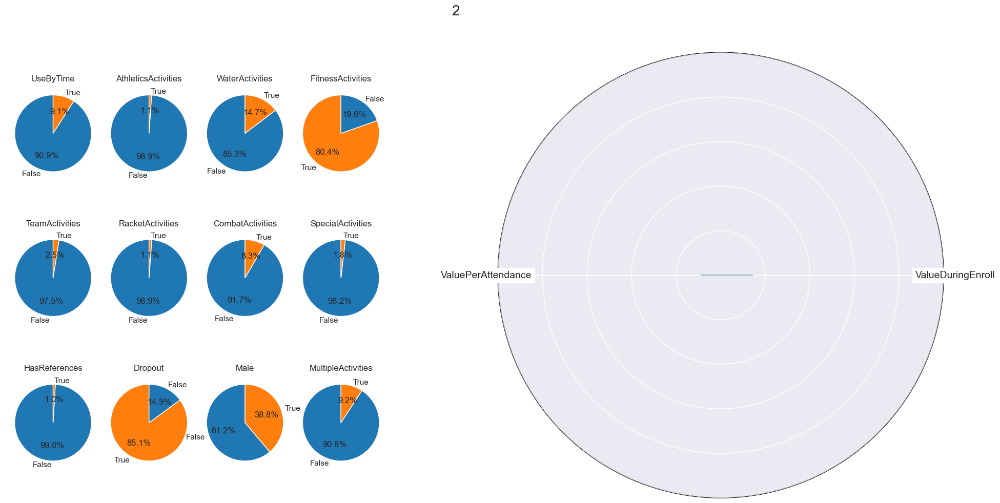

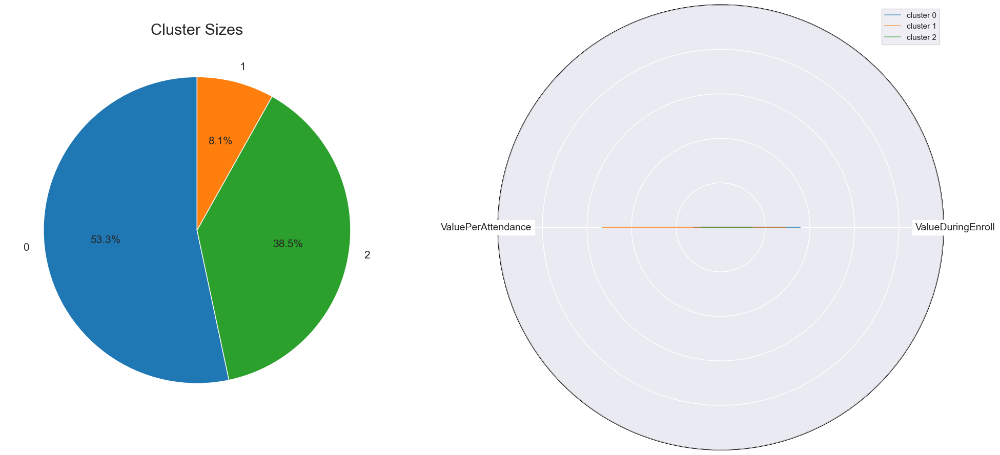

In [55]:
clust_profiles(data_concat,data_eng_out,"hclust_seg2",seg_2,num_feats_all,cat_feats_all)

In [56]:
clust_profiles(data_concat,data_eng_out,"kmclust_seg2",seg_2,num_feats_all,cat_feats,group_by=True,used_scaler=scaler,group_all=True)


,kmclust_seg2,0,1,2
Age,mean,24.89,26.48,24.11
Income,mean,2042.24,2289.85,1978.22
DaysWithoutFrequency,mean,38.21,104.94,139.34
LifetimeValue,mean,397.37,230.26,217.01
NumberOfFrequencies,mean,42.03,41.28,4.65
AttendedClasses,mean,17.36,4.49,2.36
AllowedWeeklyVisitsBySLA,mean,5.20,6.41,5.02
AllowedNumberOfVisitsBySLA,mean,38.86,45.66,37.80
RealNumberOfVisits,mean,5.27,5.47,0.87
NumberOfRenewals,mean,0.97,1.42,0.93


### R2 score for the different algorithms

In [57]:
r2_df=pd.Series(r2_scores)
r2_df

km_label_5      0.768286
kmclust_seg1    0.833485
kmclust_seg2    0.630374
hclust_5        0.747161
hclust_seg1     0.826147
hclust_seg2     0.608265
dtype: float64

K-means has better R2 scores so we will make our final solution with K-Means

### Segmentation Crosstab and Merging

In [58]:
pd.crosstab(data_concat["kmclust_seg1"],
            data_concat['kmclust_seg2'])

kmclust_seg2,0,1,2
kmclust_seg1,,,
0,2056,841,419
1,2410,5463,590
2,993,886,179


In [59]:
all_feats=seg_1+seg_2

centroids = data_concat.groupby(["kmclust_seg1", "kmclust_seg2"])[all_feats].mean()

#This may change from run to run since the cluster label can change
##########################################
to_merge = [(2,2),(0,2),(0,1),(2,0)]
##########################################

euclidean=pairwise_distances(centroids, metric='minkowski')
df_dists=pd.DataFrame(euclidean, columns=centroids.index, index=centroids.index)

source_target = {}
for clus in to_merge:
    if clus not in source_target.values():
        source_target[clus] = df_dists.loc[clus].sort_values().index[1]

data_concat_seg=data_concat.copy()

# Changing the behavior_labels and product_labels based on source_target
for source, target in source_target.items():
    mask = (data_concat_seg["kmclust_seg1"]==source[0]) & (data_concat_seg["kmclust_seg2"]==source[1])
    data_concat_seg.loc[mask, "kmclust_seg1"] = target[0]
    data_concat_seg.loc[mask, "kmclust_seg2"] = target[1]

# New contigency table

pd.crosstab(data_concat_seg["kmclust_seg1"],
            data_concat_seg["kmclust_seg2"])

kmclust_seg2,0,1,2
kmclust_seg1,,,
0,3316,0,0
1,2410,5463,769
2,0,1879,0


When satisfied with Segmentation profile, we create the final label to view the graphs

In [60]:
data_final=data_concat_seg.copy()
data_final['final_clust']=0
counter=-1

n_clust_seg_1=data_concat_seg["kmclust_seg1"].max()
n_clust_seg_2=data_concat_seg["kmclust_seg2"].max()

for c_1 in range(n_clust_seg_1+1):
    
    index_1=pd.Series(data_concat_seg[data_concat_seg["kmclust_seg1"]==c_1].index)
    
    for c_2 in range(n_clust_seg_2+1):
        index_2=pd.Series(data_concat_seg[data_concat_seg["kmclust_seg2"]==c_2].index)
        common_elements=index_1[index_1.isin(index_2)]
        if len(common_elements)>0:
            counter+=1
        data_final['final_clust'].loc[common_elements]=counter
        

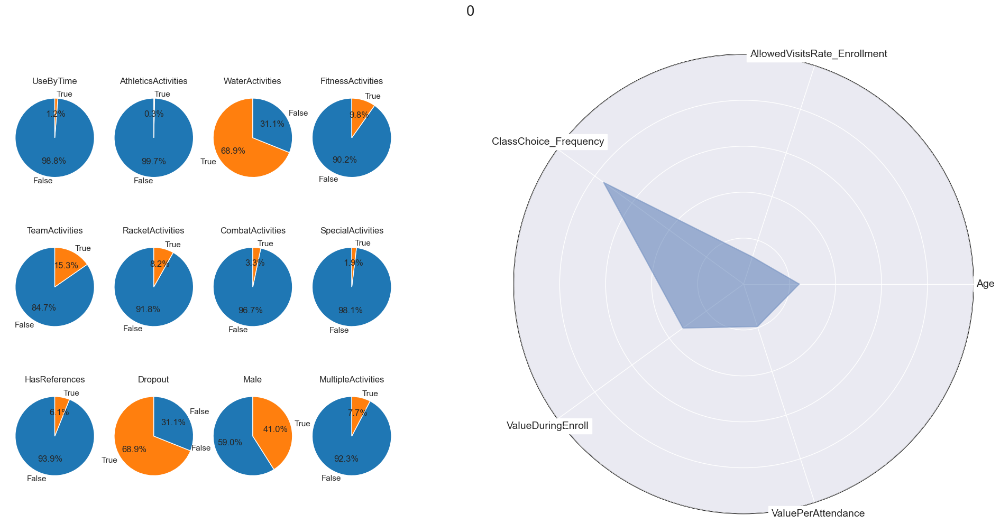

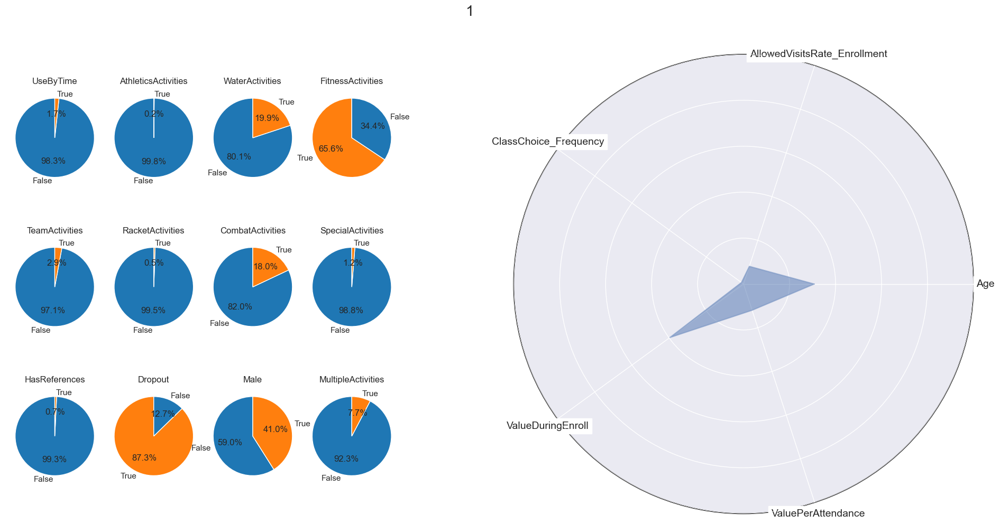

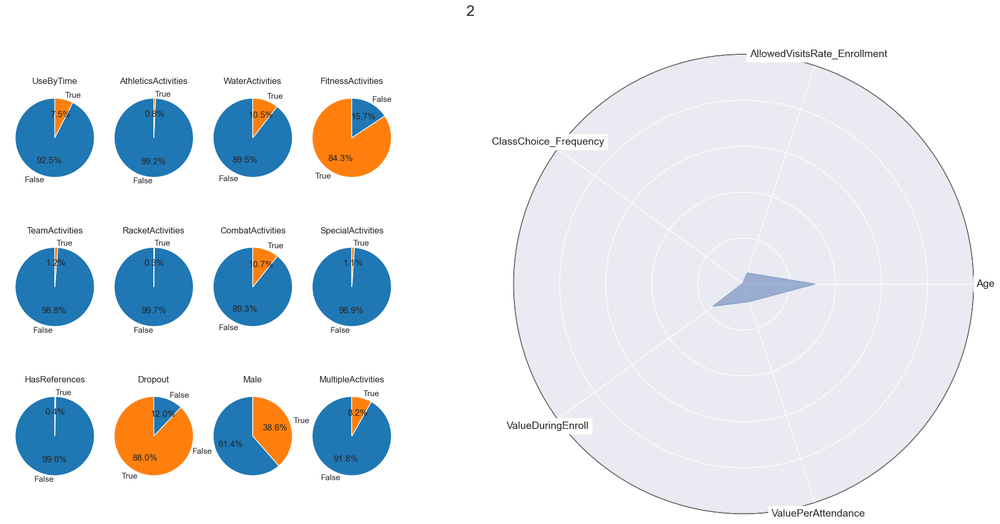

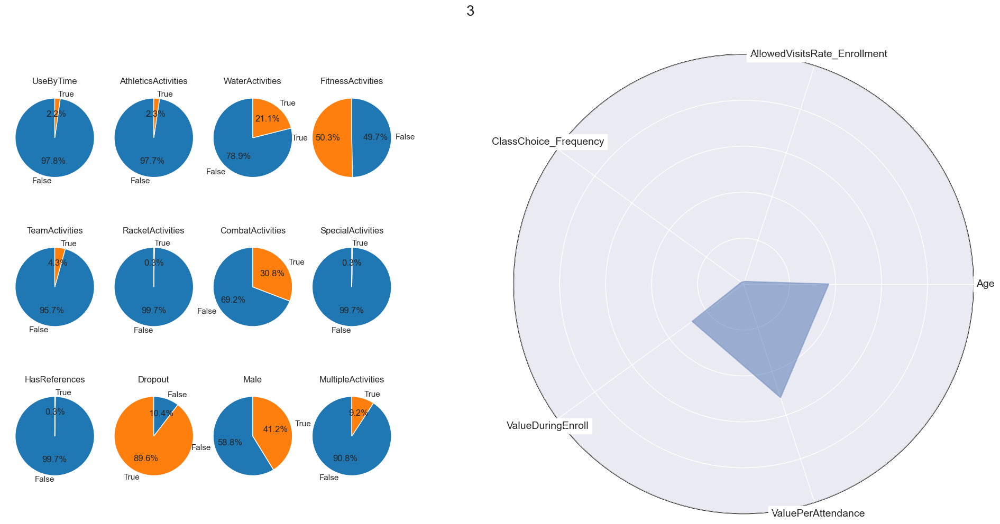

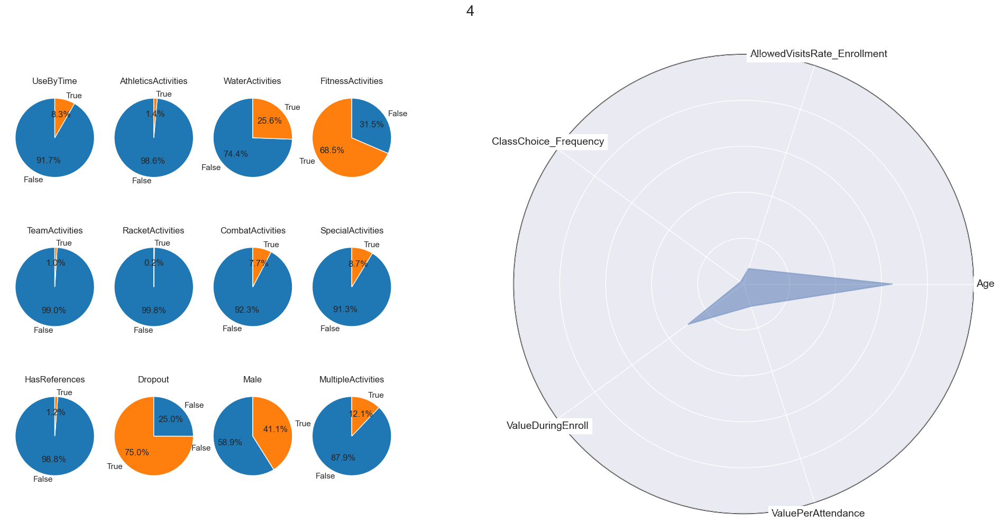

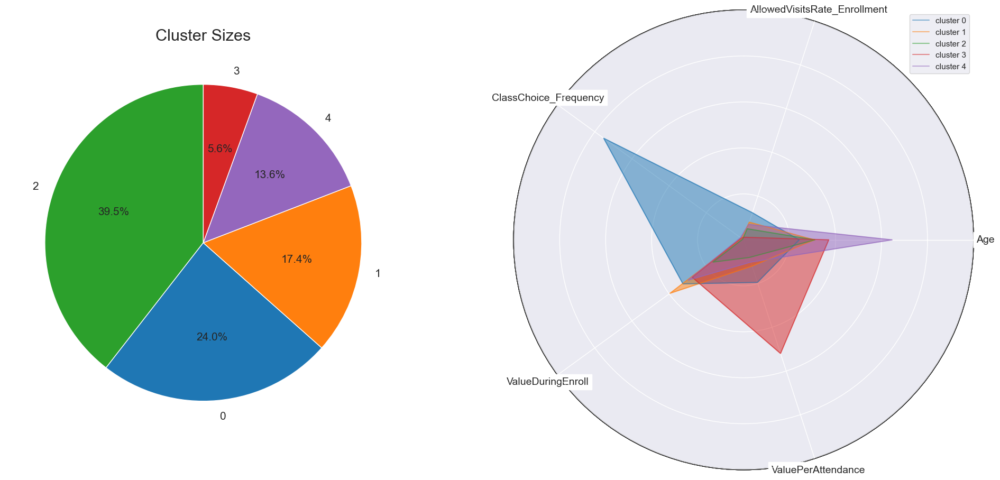

In [61]:
clust_profiles(data_final,data_eng_out,"final_clust",all_feats,num_feats_all,cat_feats_all)


In [62]:
clust_profiles(data_final,data_eng_out,"final_clust",all_feats,num_feats_all,cat_feats_all,group_by=True,used_scaler=scaler,group_all=True)


,final_clust,0,1,2,3,4
Age,mean,18.13,23.04,23.24,27.77,48.41
Income,mean,1270.61,1947.22,1996.94,2418.72,4410.48
DaysWithoutFrequency,mean,80.40,33.58,102.27,124.07,67.60
LifetimeValue,mean,532.30,200.46,187.34,153.55,368.79
NumberOfFrequencies,mean,42.45,27.16,37.62,3.20,62.55
AttendedClasses,mean,37.53,0.57,0.27,0.13,1.30
AllowedWeeklyVisitsBySLA,mean,2.58,6.73,6.93,6.43,6.86
AllowedNumberOfVisitsBySLA,mean,21.17,48.31,48.69,47.23,51.29
RealNumberOfVisits,mean,3.66,5.47,5.63,0.86,6.59
NumberOfRenewals,mean,1.73,0.37,1.24,0.72,1.44


In [63]:
r2(data_final,all_feats,"final_clust")

0.7491964940986586

## Cluster Model Performance and Outlier Classification

In [64]:
c_feats=cat_feats_all.copy()
c_feats.remove('EnrollmentStart')
c_feats.remove('EnrollmentFinish')
c_feats.remove('LastPeriodStart')
c_feats.remove('LastPeriodFinish')
c_feats.remove('DateLastVisit')

X=data_final[selec_feats]
y=data_final["km_label_5"]

X_seg=data_final[all_feats]
y_seg=data_final["final_clust"]

outliers_data=outliers_scaled[selec_feats]
outliers_data_seg=outliers_scaled[all_feats]

dt=DecisionTreeClassifier(random_state=42,max_depth=3)

### For the not segmented solution

#### Decision Tree

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dt.fit(X_train,y_train)
print("Accuracy of DT:",dt.score(X_test, y_test)*100)

Accuracy of DT: 94.07514450867052


In [66]:
outliers_pred=outliers_scaled.copy()

sil_before=silhouette_score(X,y)
r2_before=r2(data_final,selec_feats,"km_label_5")

outliers_pred["km_label_5"]=dt.predict(outliers_data)
data_class_dt=pd.concat([data_final,outliers_pred])

sil_after=silhouette_score(data_class_dt[selec_feats],data_class_dt["km_label_5"])
r2_after=r2(data_class_dt,selec_feats,"km_label_5")

print("Before outlier classification:")
print("   R2:",r2_before)
print("   Silhouette:",sil_before)
print('\n')
print("After outlier classification:")
print("   R2:",r2_after)
print("   Silhouette:",sil_after)


Before outlier classification:
   R2: 0.7682864977500452
   Silhouette: 0.39028033881866175


After outlier classification:
   R2: 0.6913887183178815
   Silhouette: 0.3707940973255631


#### Nearest Centroid

In [67]:
outliers_pred=outliers_scaled.copy()
centroids=data_final.groupby(["km_label_5"])[selec_feats].mean()
centroids_ind=centroids.index
outliers_ind=outliers_pred.index
clust_pred=[]

sil_before=silhouette_score(X,y)
r2_before=r2(data_final,selec_feats,"km_label_5")

for out_ind in outliers_ind:
    min_dist=10000000
    for cen_ind in centroids_ind:
        dist=sum((outliers_pred[selec_feats].loc[out_ind]-centroids.loc[cen_ind])**2)**(1/2)
        if dist<min_dist:
            cen=cen_ind
    clust_pred.append(cen)

outliers_pred["km_label_5"]=clust_pred
data_class_nc=pd.concat([data_final,outliers_pred])

sil_after=silhouette_score(data_class_nc[selec_feats],data_class_nc["km_label_5"])
r2_after=r2(data_class_nc,selec_feats,"km_label_5")

print("Before outlier classification:")
print("   R2:",r2_before)
print("   Silhouette:",sil_before)
print('\n')
print("After outlier classification:")
print("   R2:",r2_after)
print("   Silhouette:",sil_after)


Before outlier classification:
   R2: 0.7682864977500452
   Silhouette: 0.39028033881866175


After outlier classification:
   R2: 0.5815114938617281
   Silhouette: 0.3137894800494357


It was expected for the R2 and Silhouette scores to decrease after outlier reintroduction.
Classifying the outliers with the decision tree gives better results so we will present the final solution with the decision tree.

In [68]:
two_dim = TSNE(random_state=42).fit_transform(data_class_dt[selec_feats])

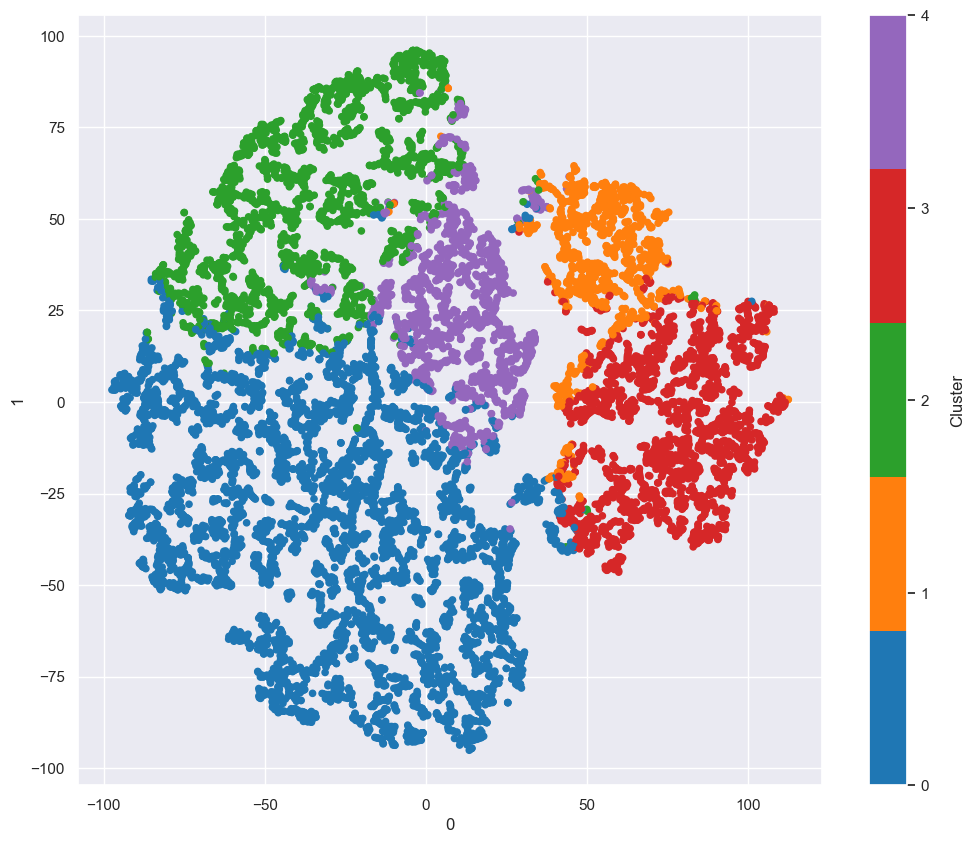

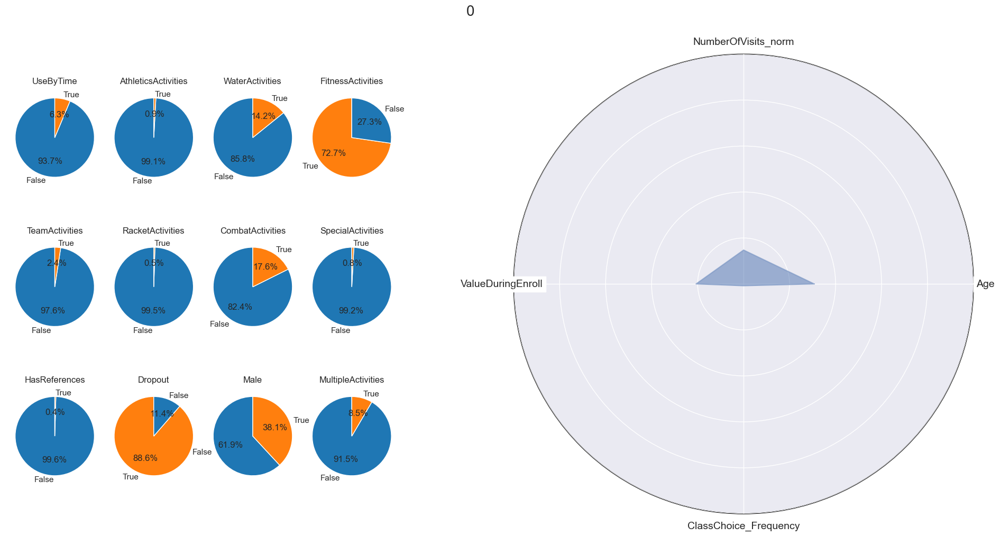

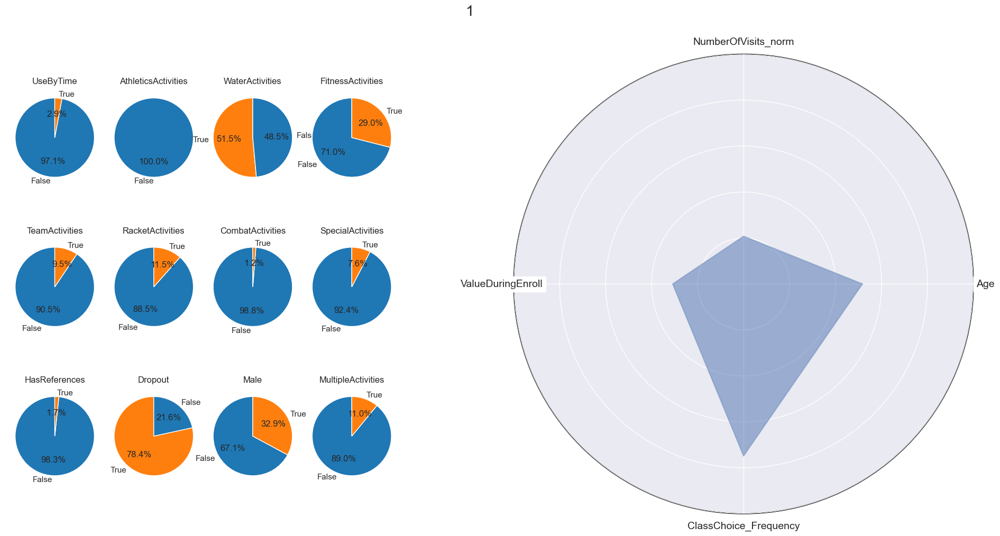

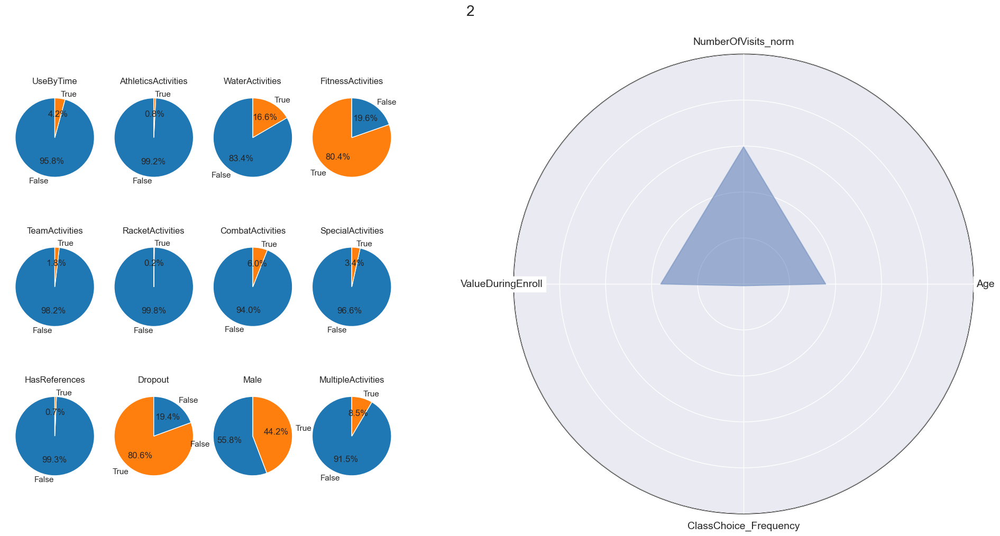

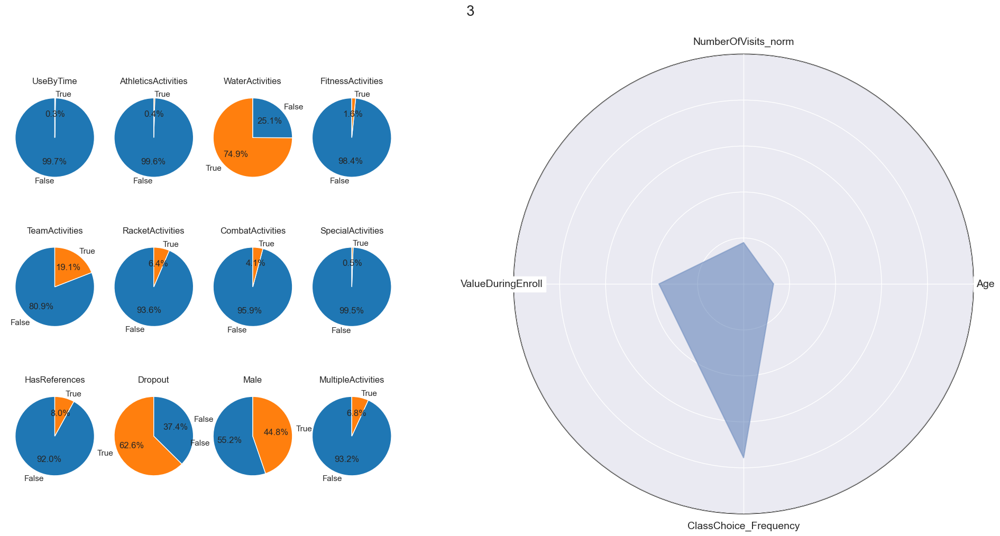

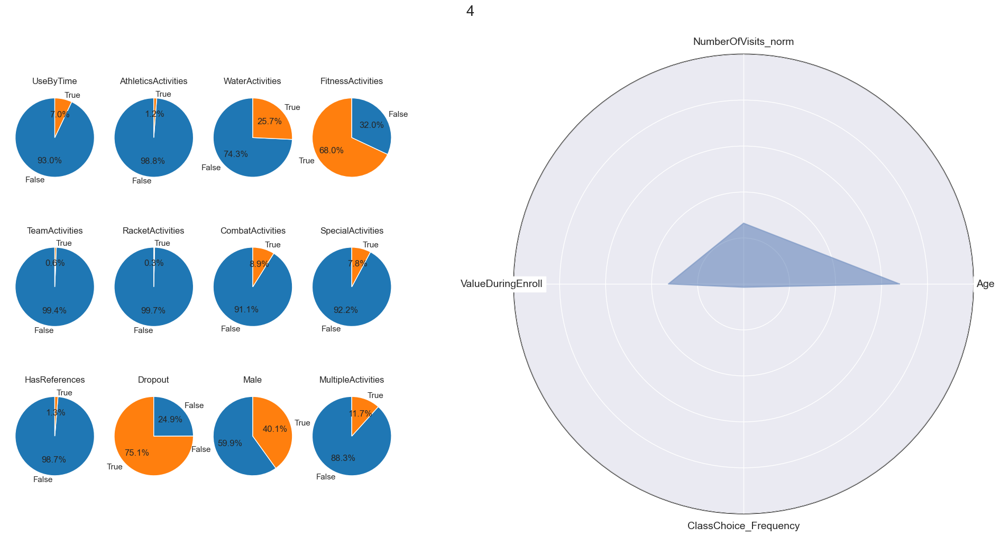

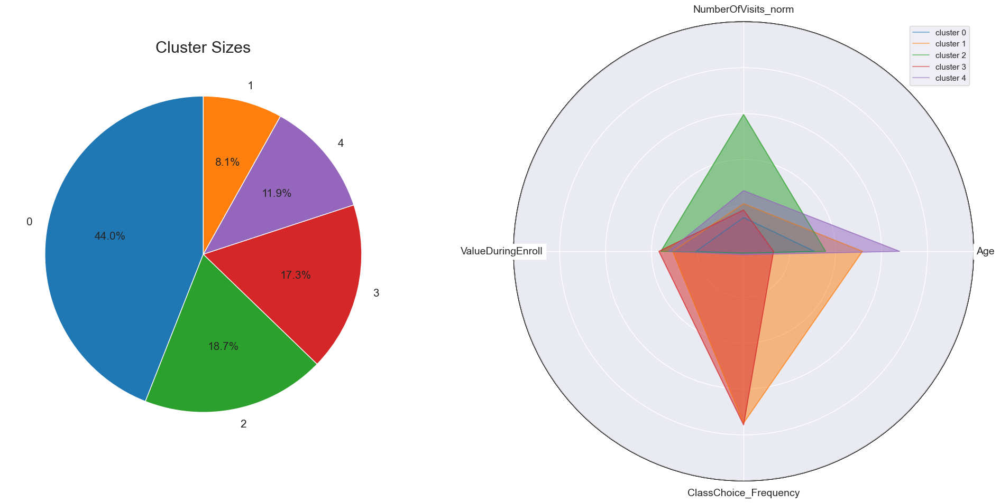

In [69]:
custom_cmap = ListedColormap(sns.color_palette("tab10", n_colors=5))
scatter=pd.DataFrame(two_dim).plot.scatter(x=0, y=1,c=data_class_dt["km_label_5"],colormap=custom_cmap, figsize=(15,10))
scatter.get_figure().get_axes()[1].remove()
cbar = scatter.figure.colorbar(scatter.collections[0])
cbar.set_ticks(data_class_dt["km_label_5"].unique())
cbar.set_ticklabels(data_class_dt["km_label_5"].unique())
cbar.set_label("Cluster", labelpad=15)

plt.show()

clust_profiles(data_class_dt,data_eng_out,"km_label_5",selec_feats,num_feats_all,cat_feats_all)

### For the segmented solution

#### Decision Tree

In [70]:
X_seg_train, X_seg_test, y_seg_train, y_seg_test = train_test_split(X_seg, y_seg, test_size=0.2, random_state=42)

dt.fit(X_seg_train,y_seg_train)
print("Accuracy of DT:",dt.score(X_seg_test, y_seg_test)*100)

Accuracy of DT: 92.63005780346822


In [71]:
outliers_pred=outliers_scaled.copy()

sil_before=silhouette_score(X_seg,y_seg)
r2_before=r2(data_final,all_feats,"final_clust")

outliers_pred["final_clust"]=dt.predict(outliers_data_seg)
data_class_dt=pd.concat([data_final,outliers_pred])

sil_after=silhouette_score(data_class_dt[all_feats],data_class_dt["final_clust"])
r2_after=r2(data_class_dt,all_feats,"final_clust")

print("Before outlier classification:")
print("   R2:",r2_before)
print("   Silhouette:",sil_before)
print('\n')
print("After outlier classification:")
print("   R2:",r2_after)
print("   Silhouette:",sil_after)

Before outlier classification:
   R2: 0.7491964940986586
   Silhouette: 0.37735063554622444


After outlier classification:
   R2: 0.487855723760536
   Silhouette: 0.32725079617222397


#### Nearest Centroid

In [72]:
outliers_pred=outliers_scaled.copy()
centroids=data_final.groupby(["final_clust"])[all_feats].mean()
centroids_ind=centroids.index
outliers_ind=outliers_pred.index
clust_pred=[]

sil_before=silhouette_score(X,y)
r2_before=r2(data_final,all_feats,"final_clust")

for out_ind in outliers_ind:
    min_dist=10000000
    for cen_ind in centroids_ind:
        dist=sum((outliers_pred[all_feats].loc[out_ind]-centroids.loc[cen_ind])**2)**(1/2)
        if dist<min_dist:
            cen=cen_ind
    clust_pred.append(cen)

outliers_pred["final_clust"]=clust_pred
data_class_nc=pd.concat([data_final,outliers_pred])

sil_after=silhouette_score(data_class_nc[all_feats],data_class_nc["final_clust"])
r2_after=r2(data_class_nc,all_feats,"final_clust")

print("Before outlier classification:")
print("   R2:",r2_before)
print("   Silhouette:",sil_before)
print('\n')
print("After outlier classification:")
print("   R2:",r2_after)
print("   Silhouette:",sil_after)

Before outlier classification:
   R2: 0.7491964940986586
   Silhouette: 0.39028033881866175


After outlier classification:
   R2: 0.4283161658787812
   Silhouette: 0.260845346136369


It was expected for the R2 and Silhouette scores to decrease after outlier reintroduction.
Classifying the outliers with the decision tree gives better results so we will present the final solution with the decision tree.

In [73]:
two_dim = TSNE(random_state=42).fit_transform(data_class_dt[all_feats])

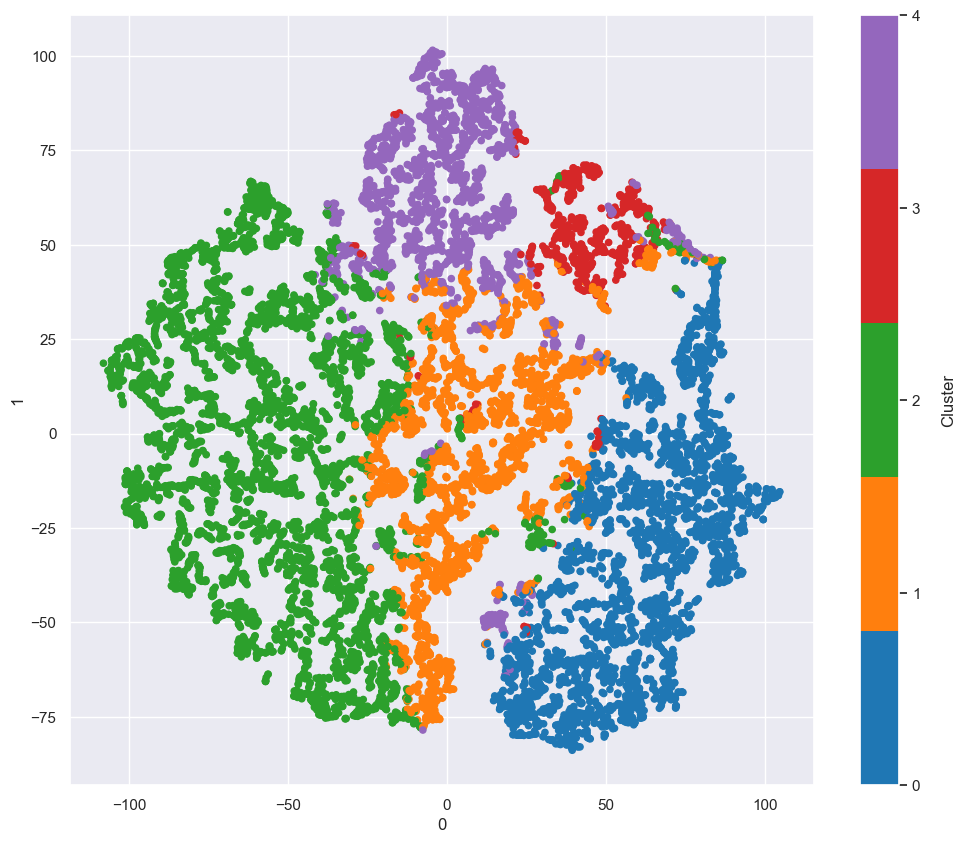

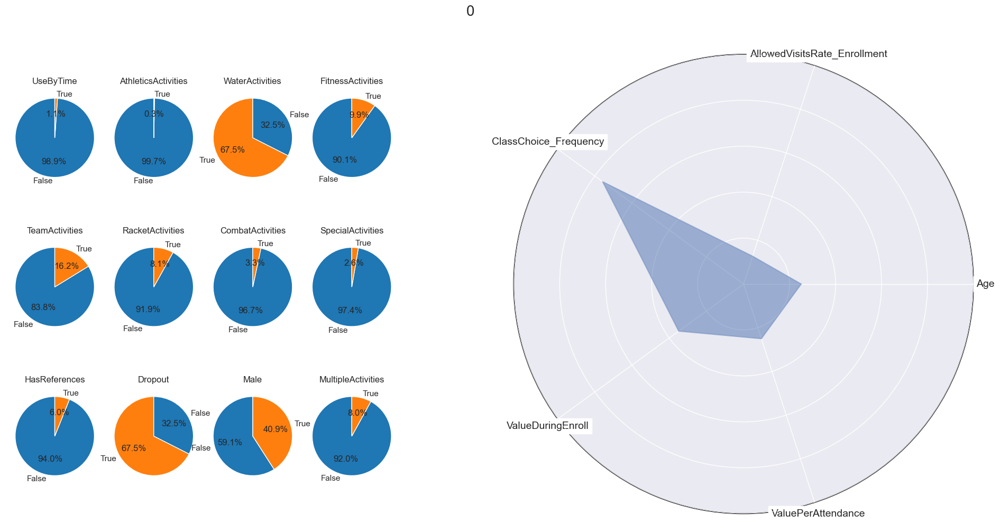

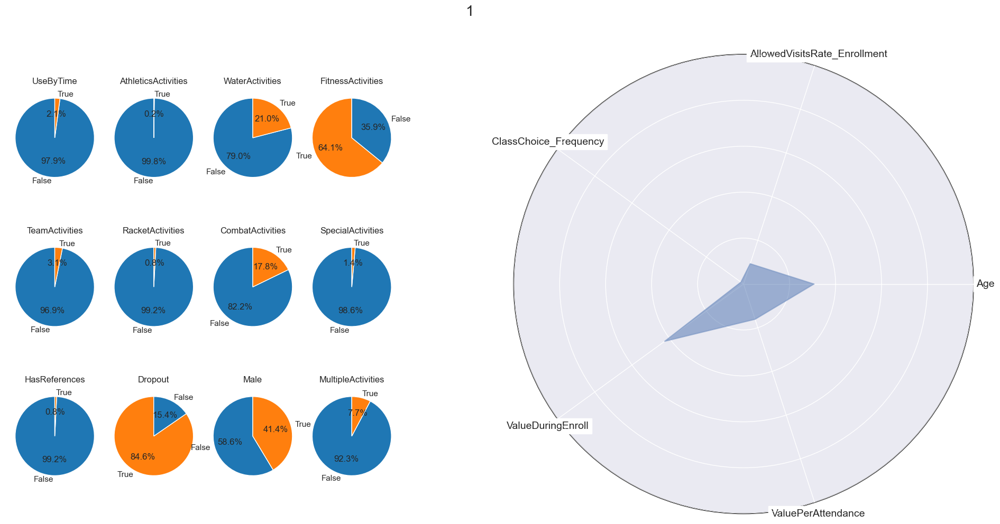

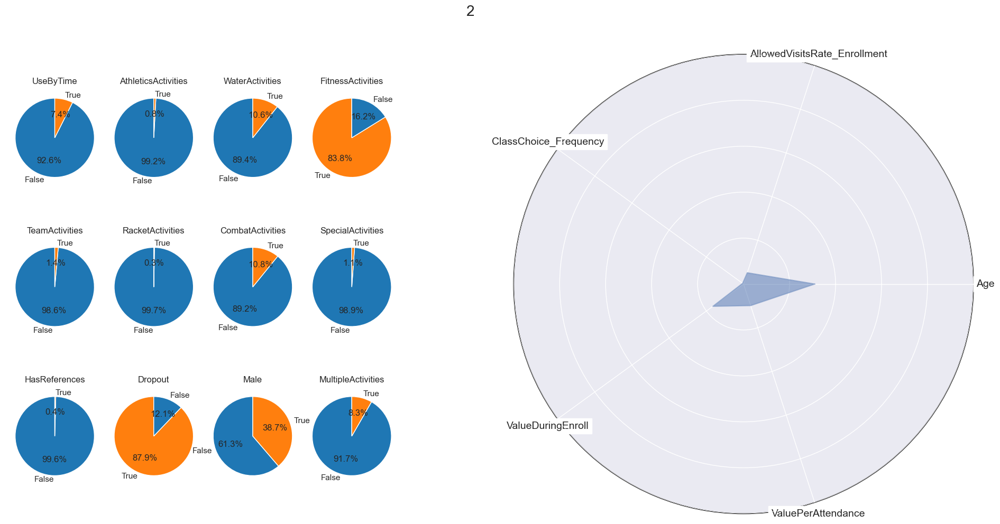

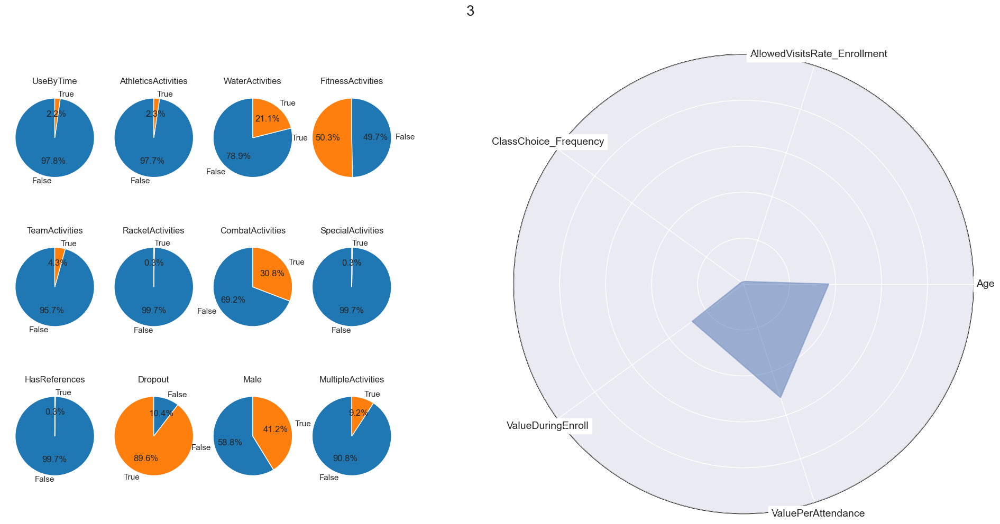

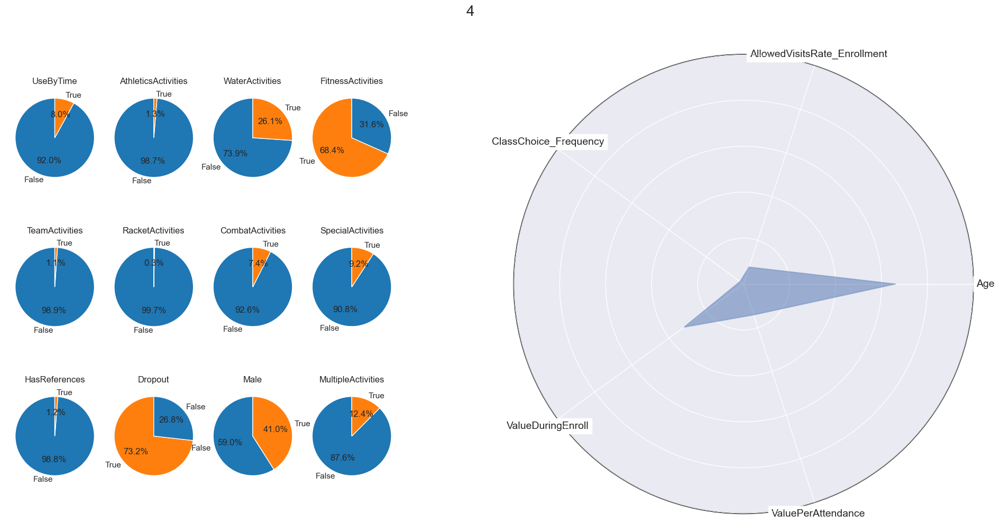

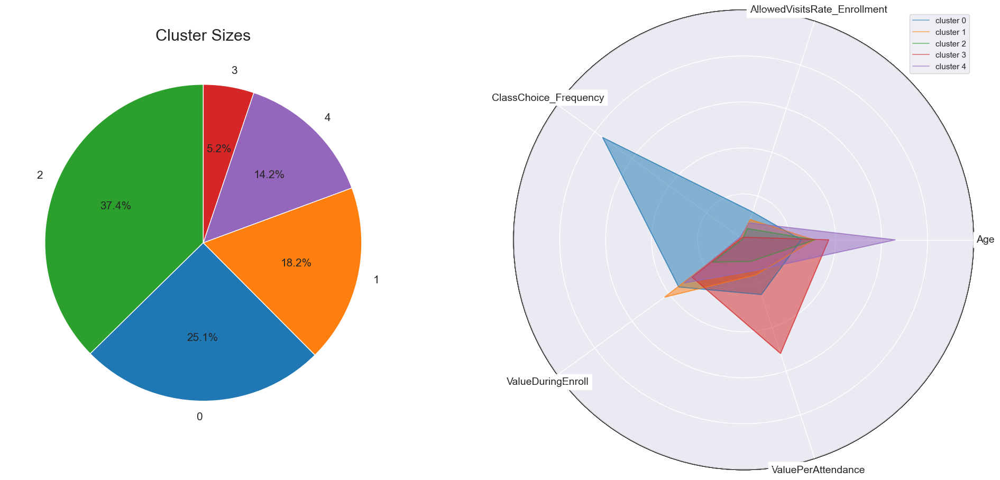

In [74]:
custom_cmap = ListedColormap(sns.color_palette("tab10", n_colors=5))
scatter=pd.DataFrame(two_dim).plot.scatter(x=0, y=1,c=data_class_dt["final_clust"],colormap=custom_cmap, figsize=(15,10))
scatter.get_figure().get_axes()[1].remove()
cbar = scatter.figure.colorbar(scatter.collections[0])
cbar.set_ticks(data_class_dt["final_clust"].unique())
cbar.set_ticklabels(data_class_dt["final_clust"].unique())
cbar.set_label("Cluster", labelpad=15)

plt.show()

clust_profiles(data_class_dt,data_eng_out,"final_clust",all_feats,num_feats_all,cat_feats_all)